In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Oversampling of Data

In [ ]:
# Install the required libraries if you haven't already
# pip install imbalanced-learn scikit-learn pandas

import pandas as pd
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE

# Load your dataset
data = pd.read_csv("/content/drive/MyDrive/ML_Project/DiseaseData - Sheet1.csv")

# Separate features and target variable
X = data.drop(['id', 'prognosis'], axis=1)  # Dropping 'id' and 'prognosis' columns
y = data['prognosis']

# Encode the target variable if it's categorical
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Apply SMOTE to balance the dataset
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y_encoded)

# Decode the resampled target back to its original form
y_resampled_decoded = label_encoder.inverse_transform(y_resampled)

# Combine the resampled data into a DataFrame
X_resampled_df = pd.DataFrame(X_resampled, columns=X.columns)
resampled_data = pd.concat([X_resampled_df, pd.Series(y_resampled_decoded, name='prognosis')], axis=1)

# Save the resampled dataset
resampled_data.to_csv('DiseaseData_Resampled.csv', index=False)

print("Resampled dataset saved successfully as 'DiseaseData_Resampled.csv'.")

Resampled dataset saved successfully as 'DiseaseData_Resampled.csv'.


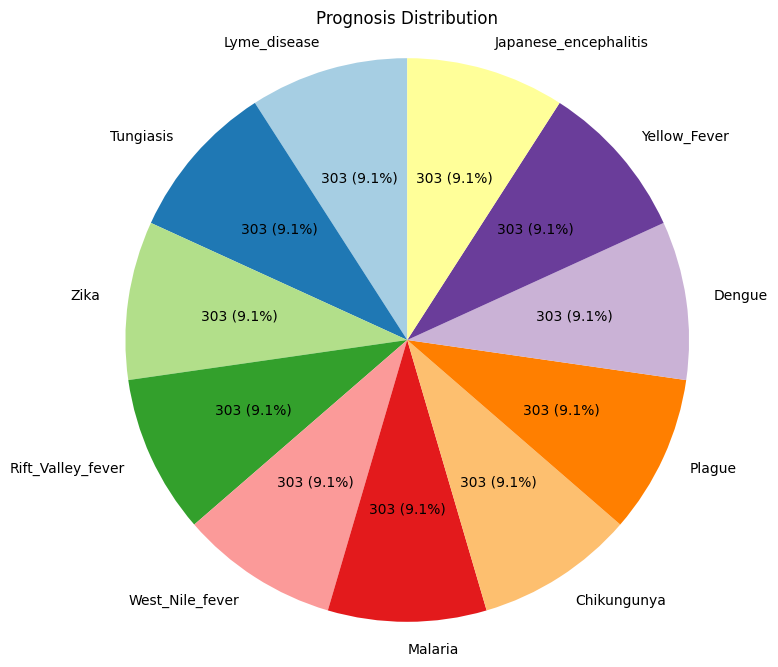

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load the data
file_path = '/content/drive/MyDrive/ML_Project/DiseaseData_Resampled.csv'  # Replace with the actual file path
data = pd.read_csv(file_path)

# Get the distribution of the 'prognosis' column
prognosis_counts = data['prognosis'].value_counts()

# Function to format labels with absolute numbers and percentages
def format_label(pct, allvals):
    absolute = int(np.round(pct/100. * np.sum(allvals)))
    return f"{absolute} ({pct:.1f}%)"

# Plot the pie chart
plt.figure(figsize=(8, 8))
plt.pie(prognosis_counts, labels=[f"{i}" for i in prognosis_counts.index],
        autopct=lambda pct: format_label(pct, prognosis_counts), startangle=90, colors=plt.cm.Paired.colors)
plt.title('Prognosis Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Show the pie chart
plt.show()


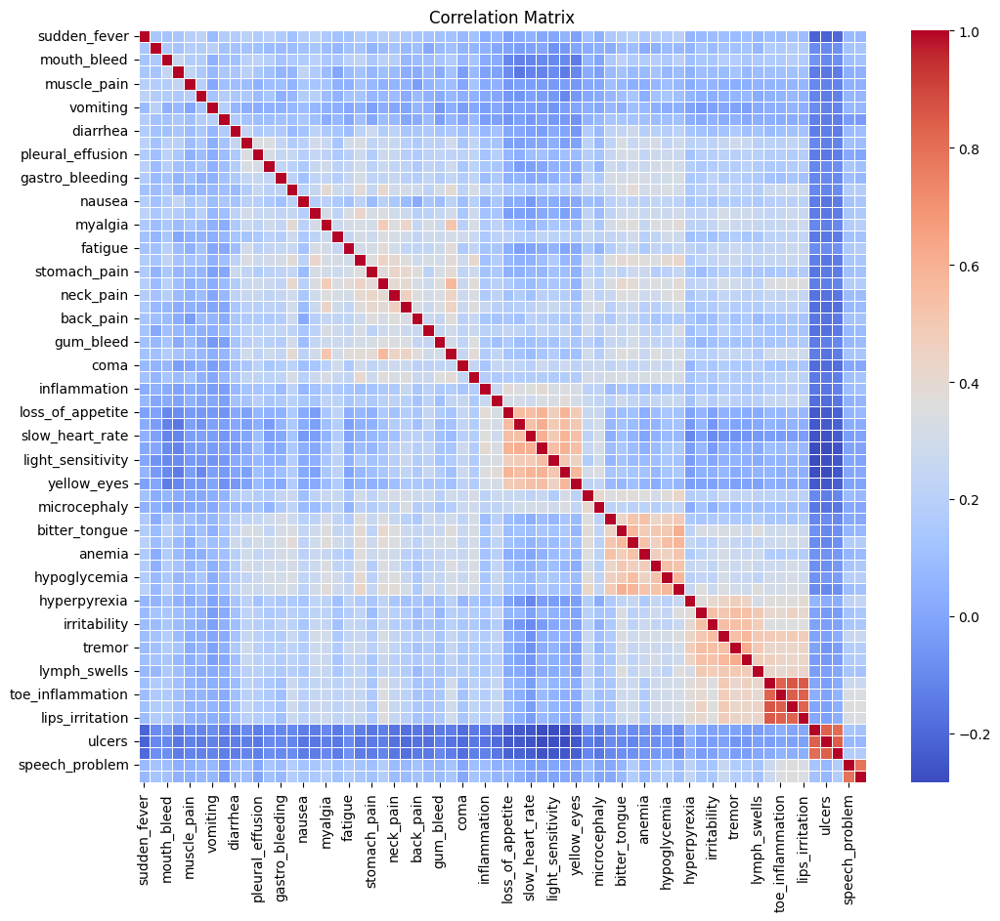

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data
file_path = '/content/drive/MyDrive/ML_Project/DiseaseData_Resampled.csv'  # Replace with the actual file path
data = pd.read_csv(file_path)

# Select only numeric columns for correlation
numeric_columns = data.select_dtypes(include=[np.number])

# Compute the correlation matrix
correlation_matrix = numeric_columns.corr()

# Create a heatmap to visualize the correlation matrix
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()


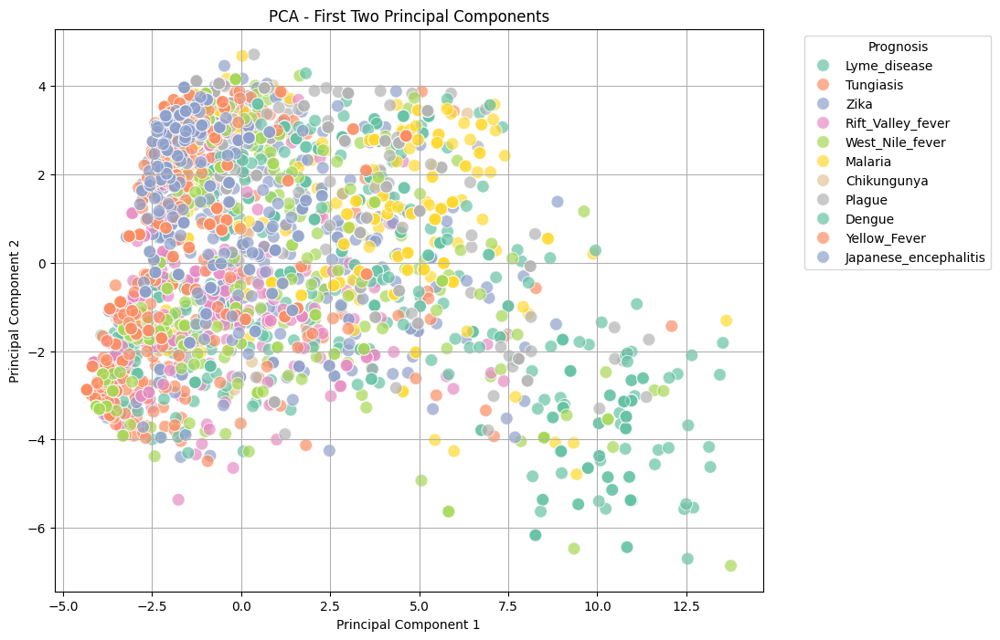

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Load the data
file_path = '/content/drive/MyDrive/ML_Project/DiseaseData_Resampled.csv'  # Replace with the actual file path
data = pd.read_csv(file_path)

# Select only numeric columns for PCA
numeric_columns = data.select_dtypes(include=[np.number])

# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(numeric_columns)

# Apply PCA
pca = PCA(n_components=2)  # Reduce to 2 principal components
pca_result = pca.fit_transform(scaled_data)

# Add the prognosis to the PCA result
pca_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
pca_df['prognosis'] = data['prognosis']  # Assuming 'prognosis' is the column with categories

# Plot the PCA result with different colors for each prognosis
plt.figure(figsize=(10, 8))

# Use seaborn to create a scatter plot with hue based on prognosis
sns.scatterplot(data=pca_df, x='PC1', y='PC2', hue='prognosis', palette='Set2', s=100, alpha=0.7)

# Add title and labels
plt.title('PCA - First Two Principal Components')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.legend(title='Prognosis', bbox_to_anchor=(1.05, 1), loc='upper left')

# Show the plot
plt.show()

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


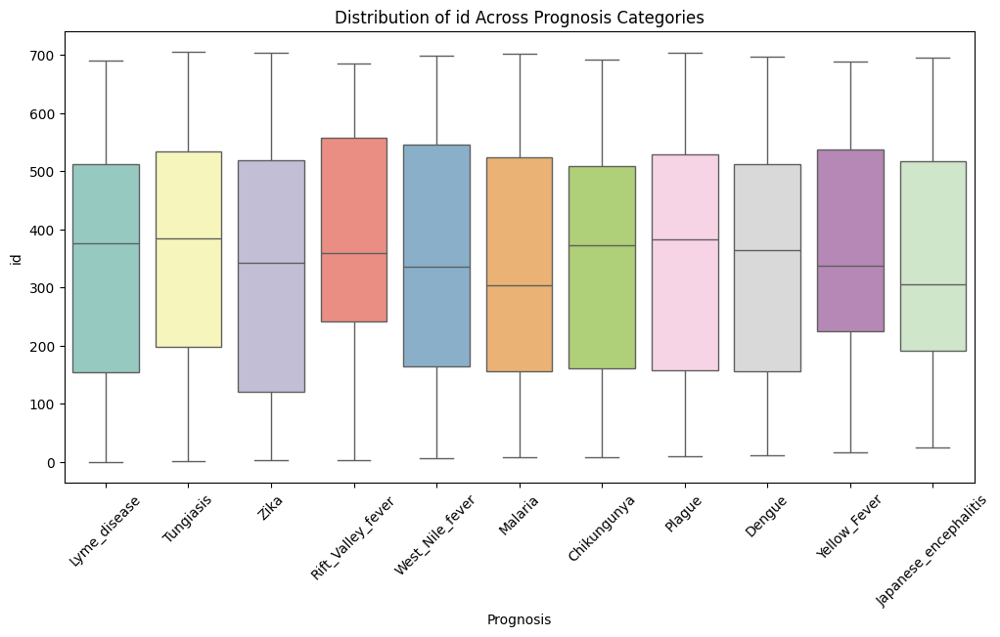

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


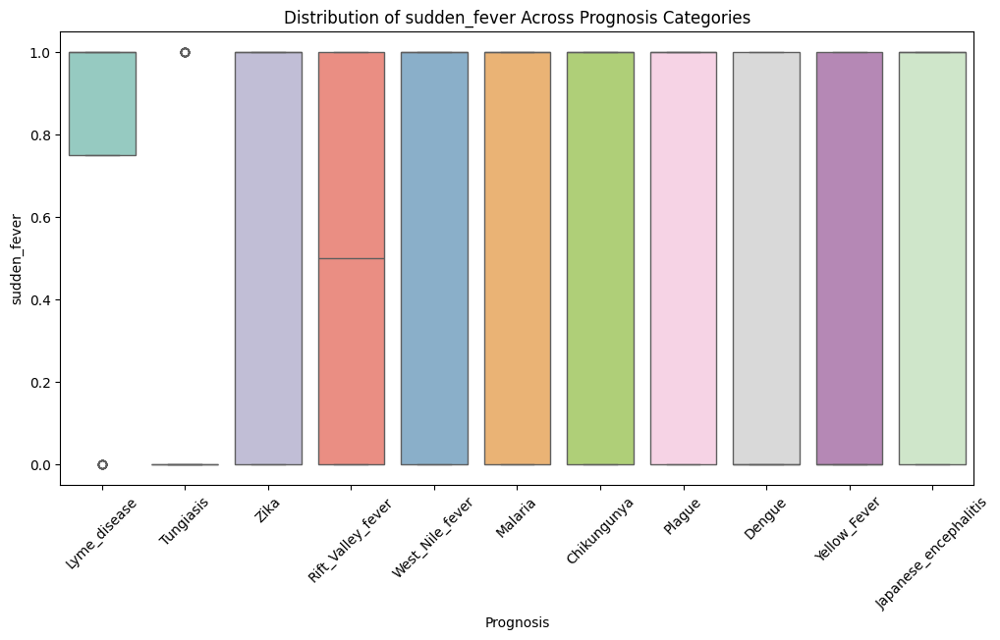

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


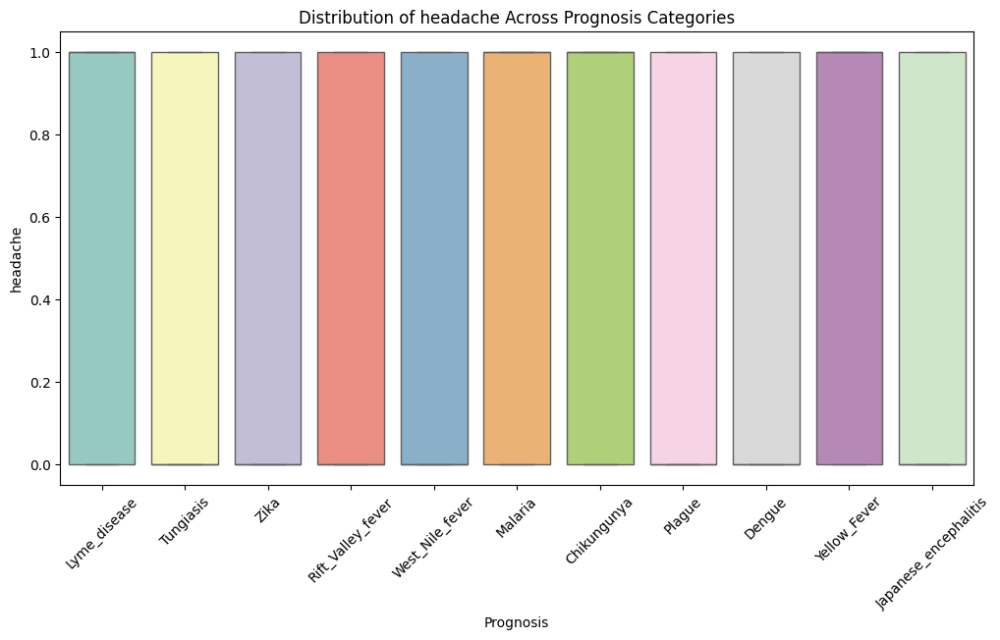

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


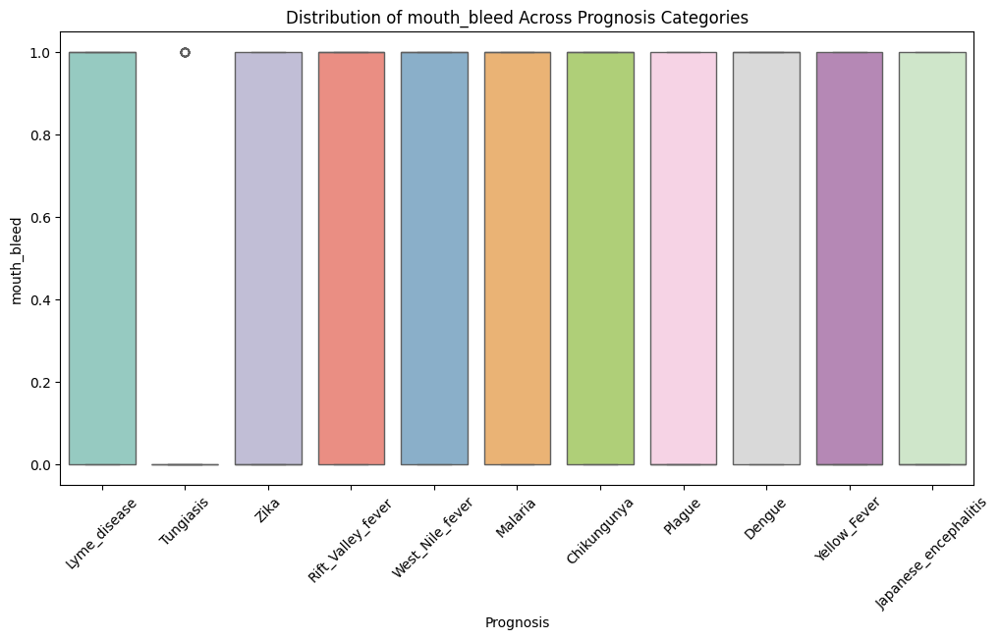

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


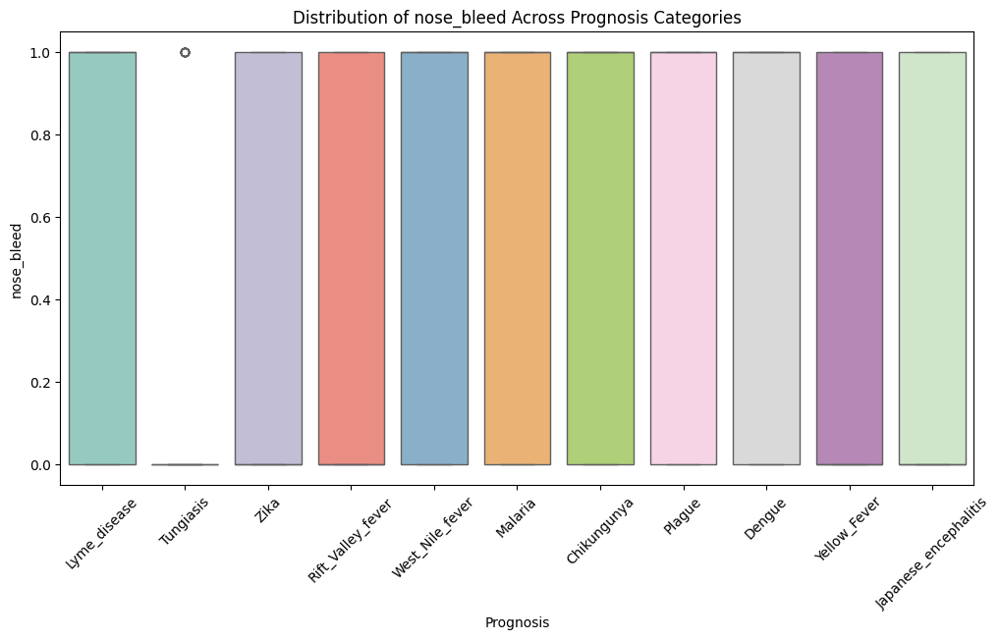

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


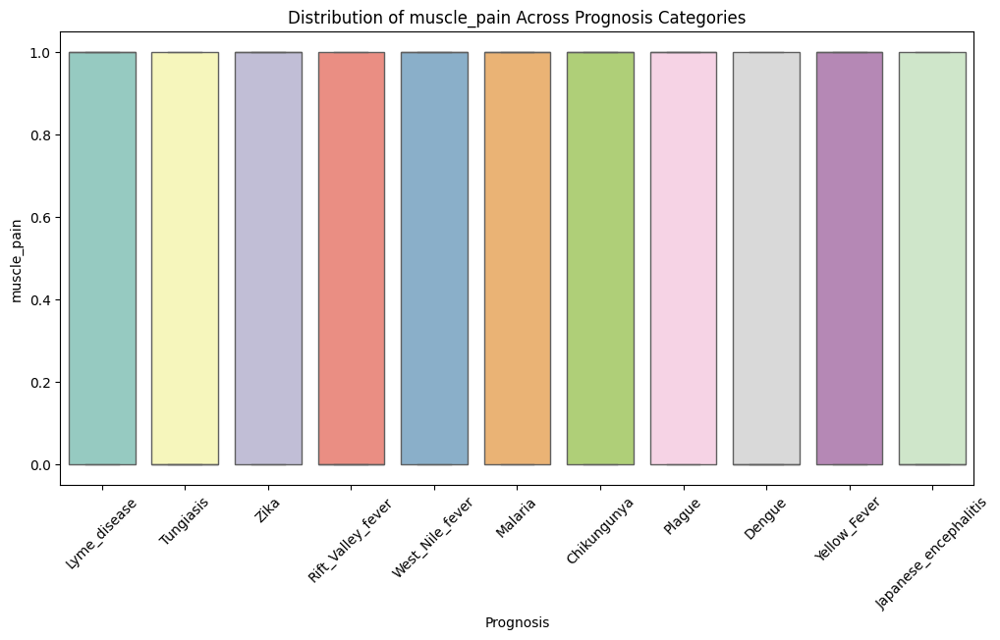

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


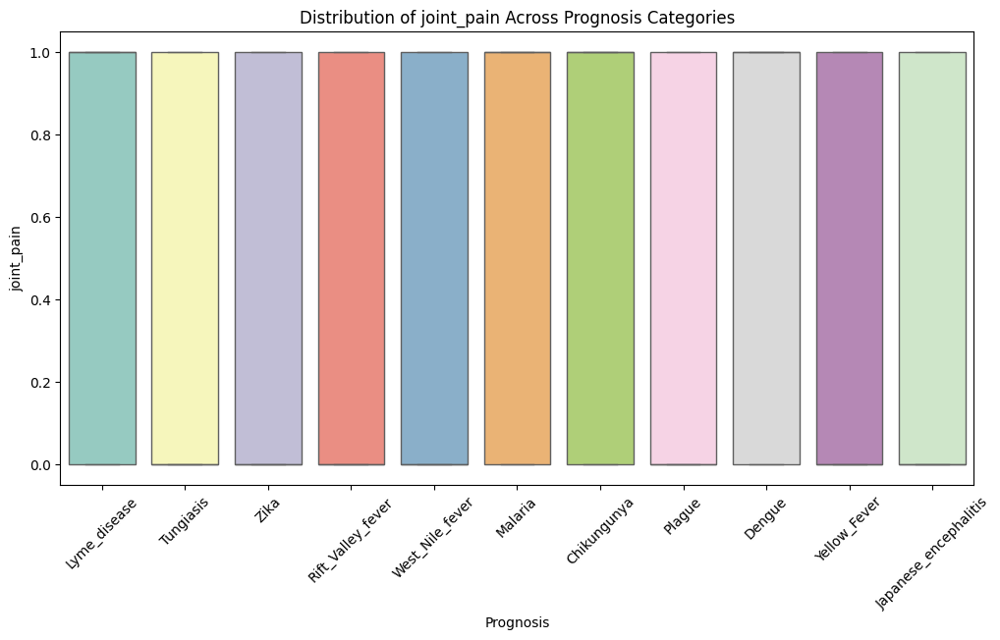

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


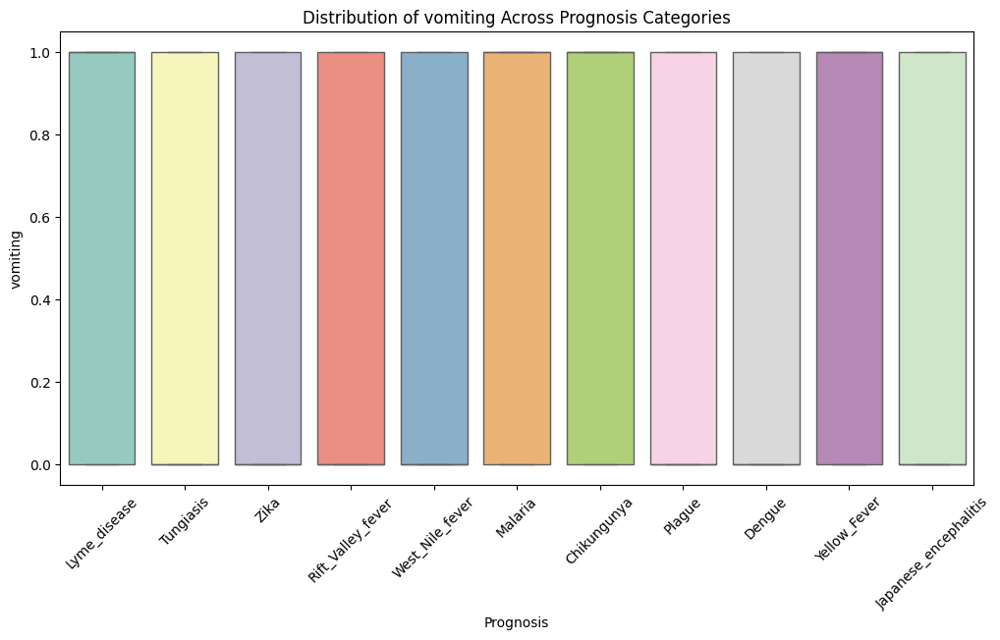

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


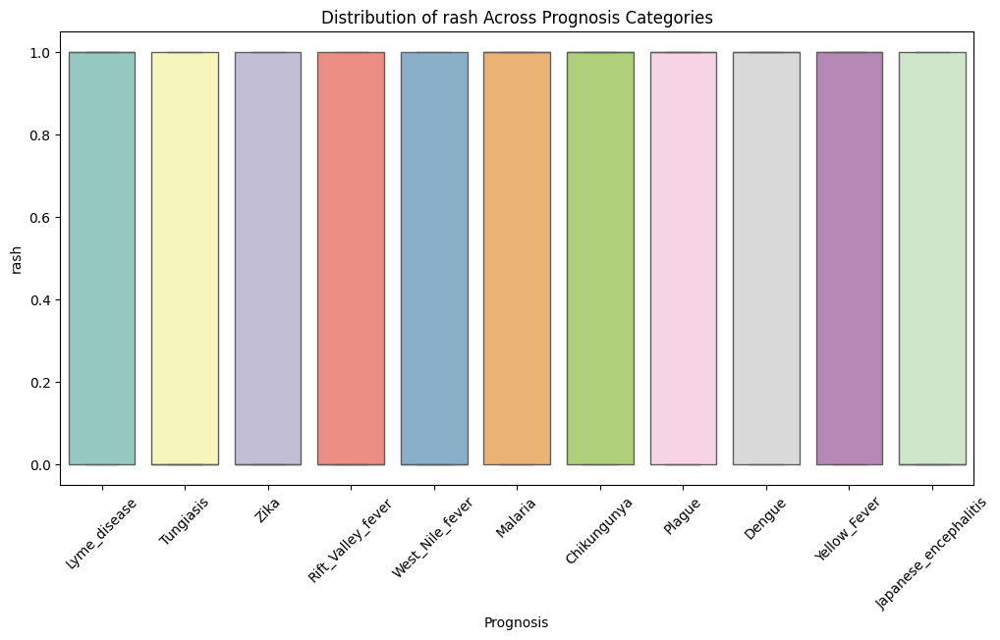

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


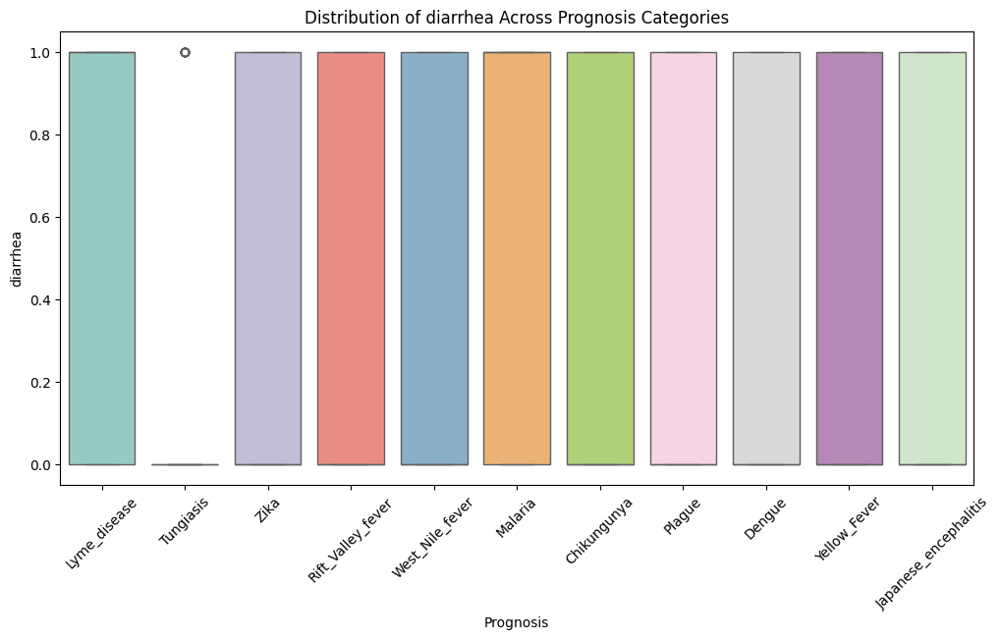

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


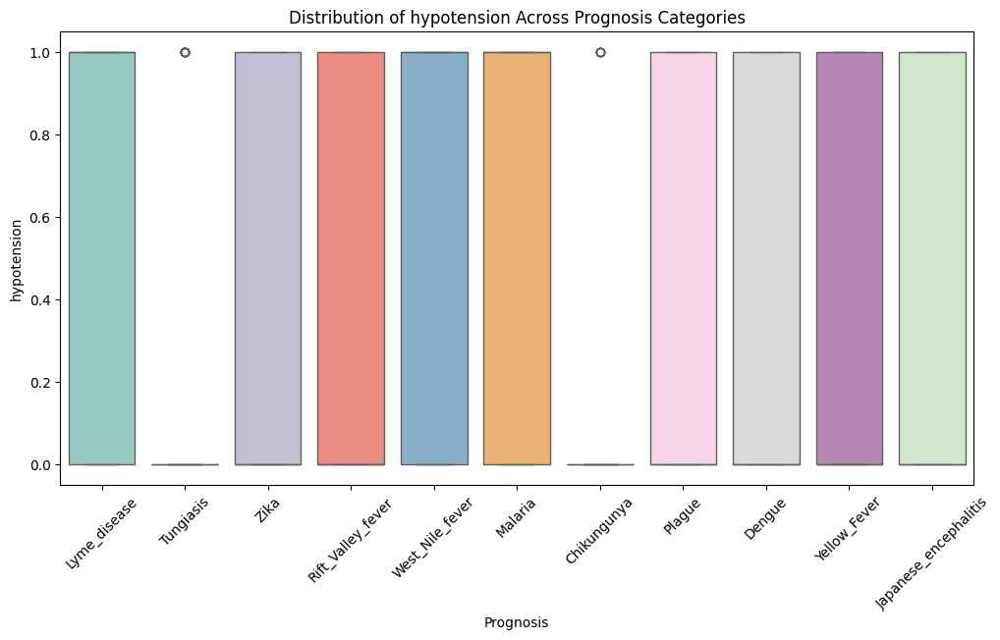

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


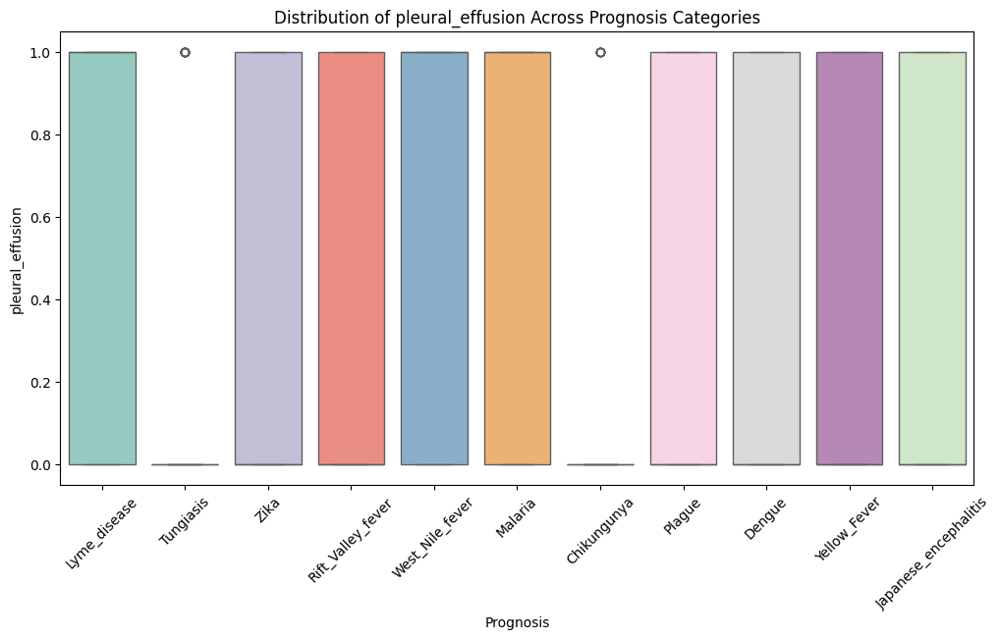

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


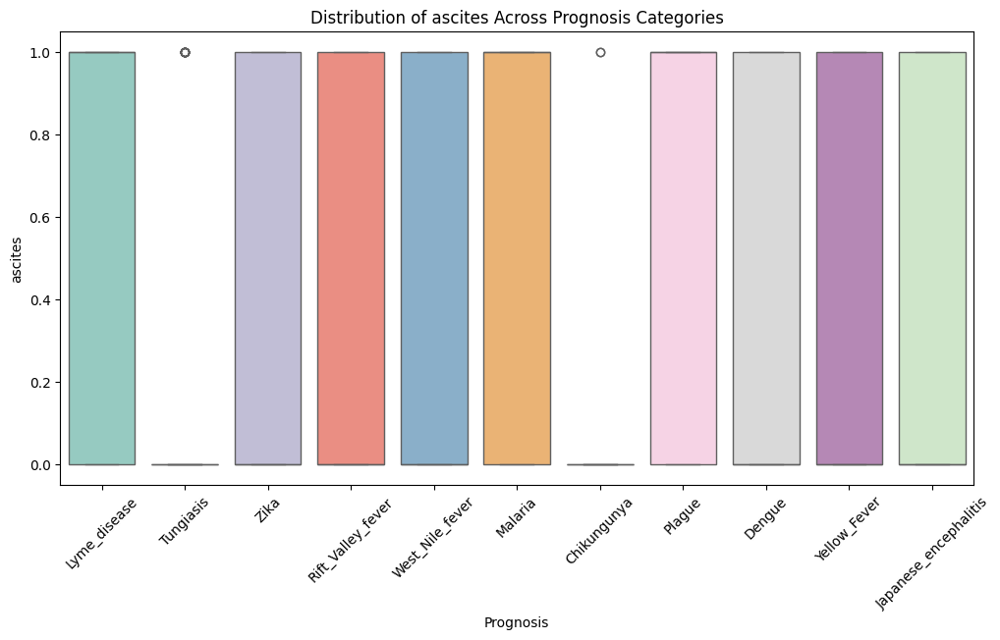

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


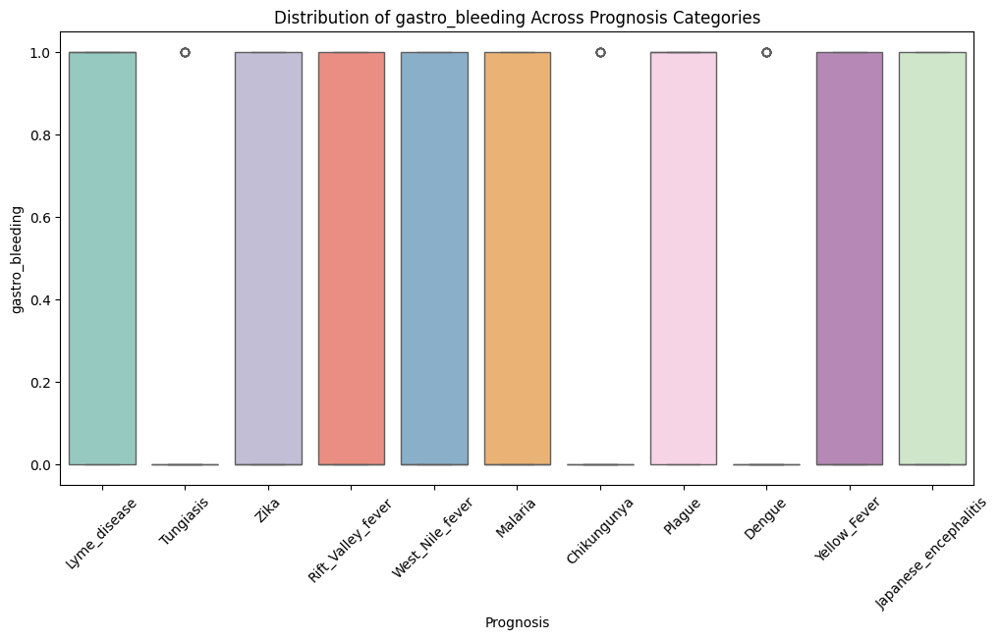

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


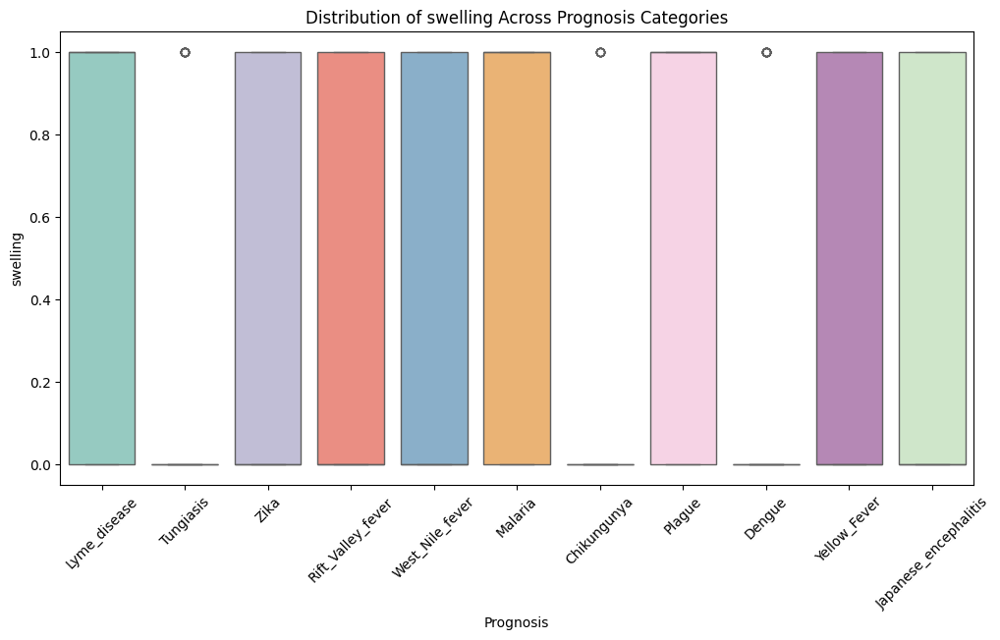

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


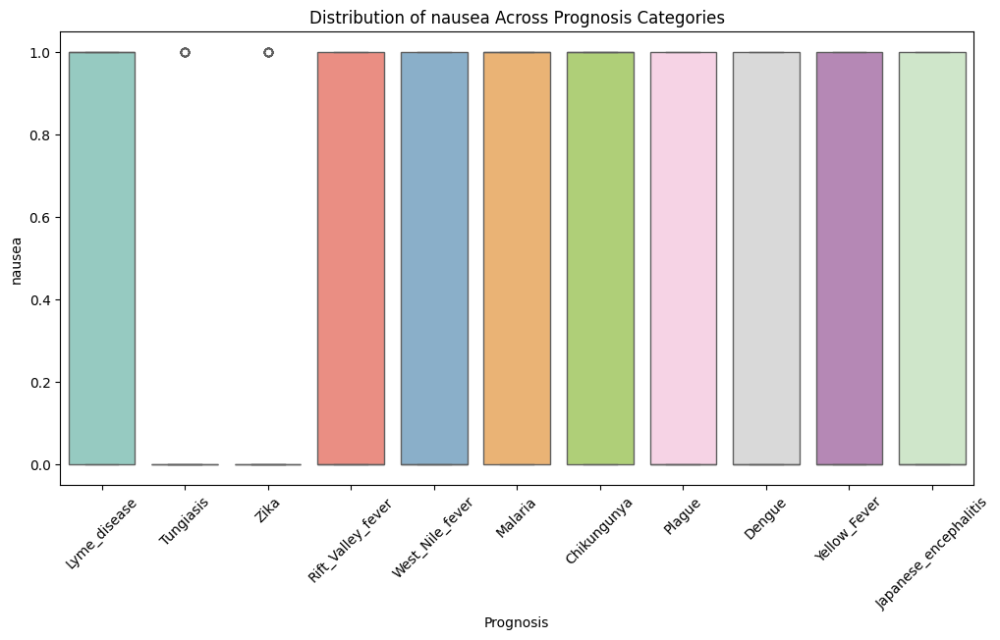

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


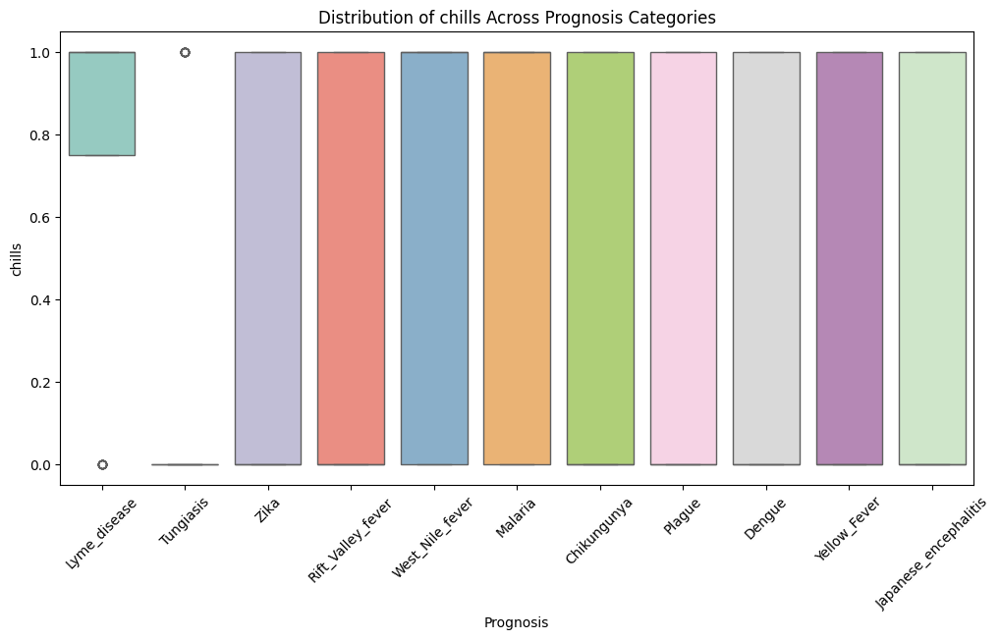

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


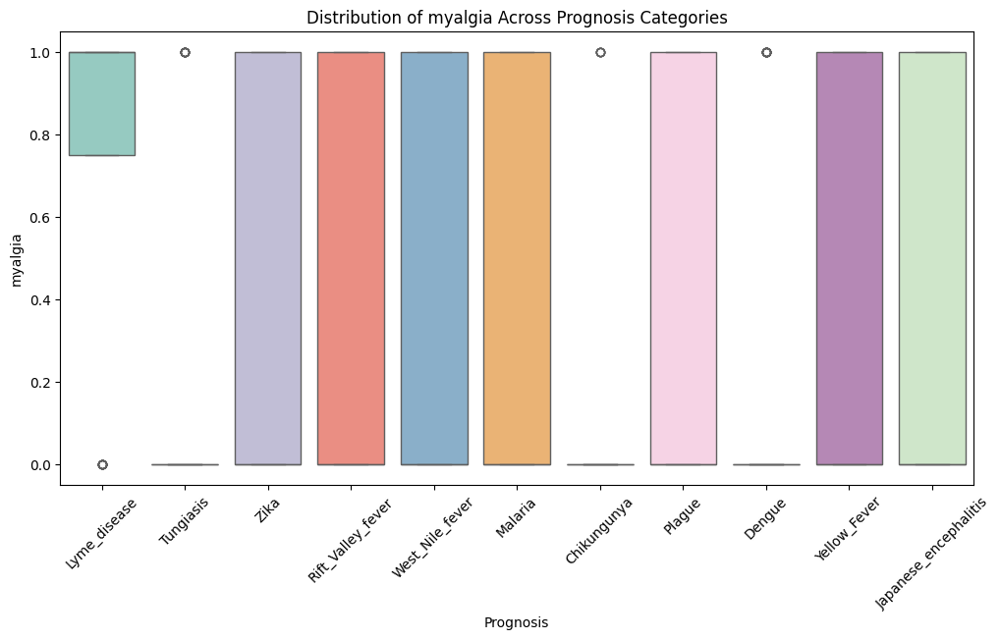

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


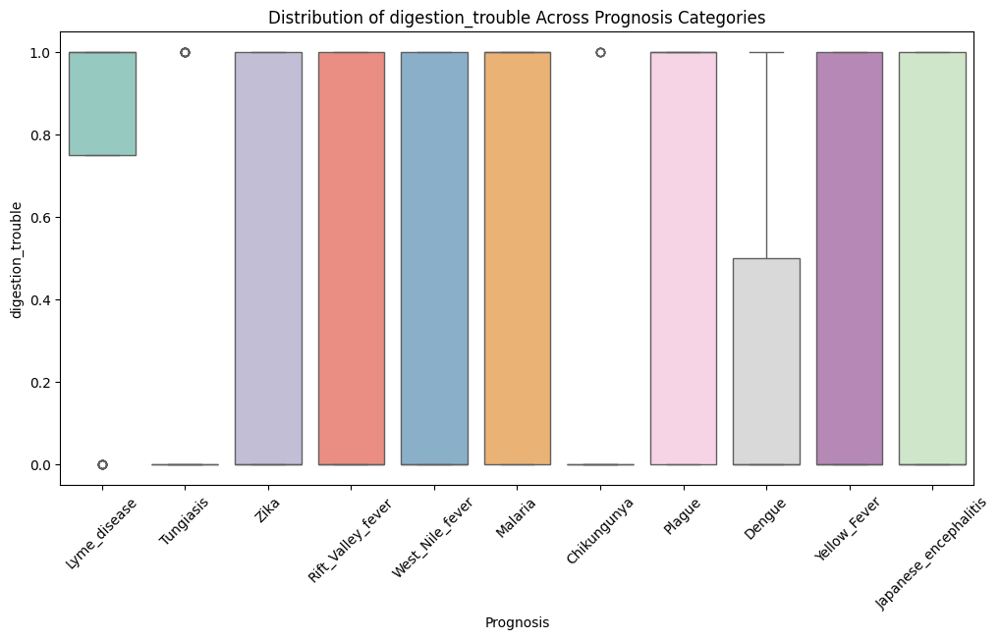

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


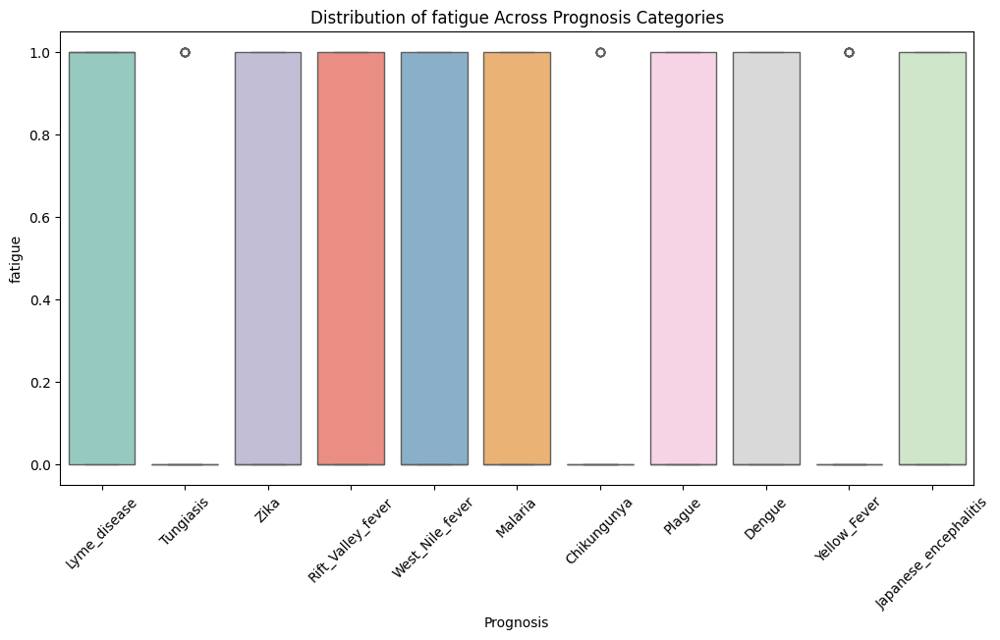

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


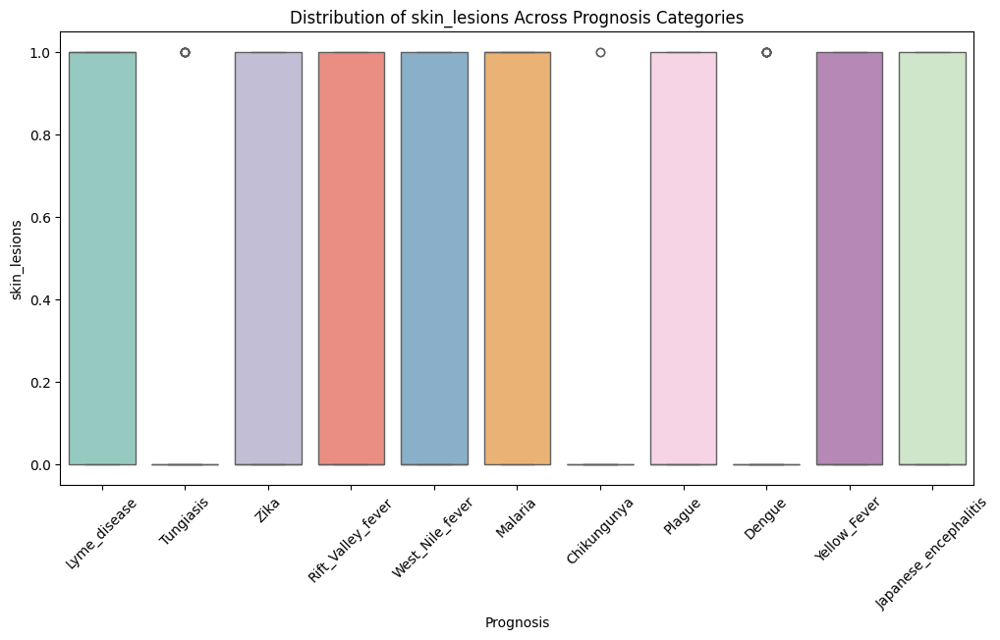

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


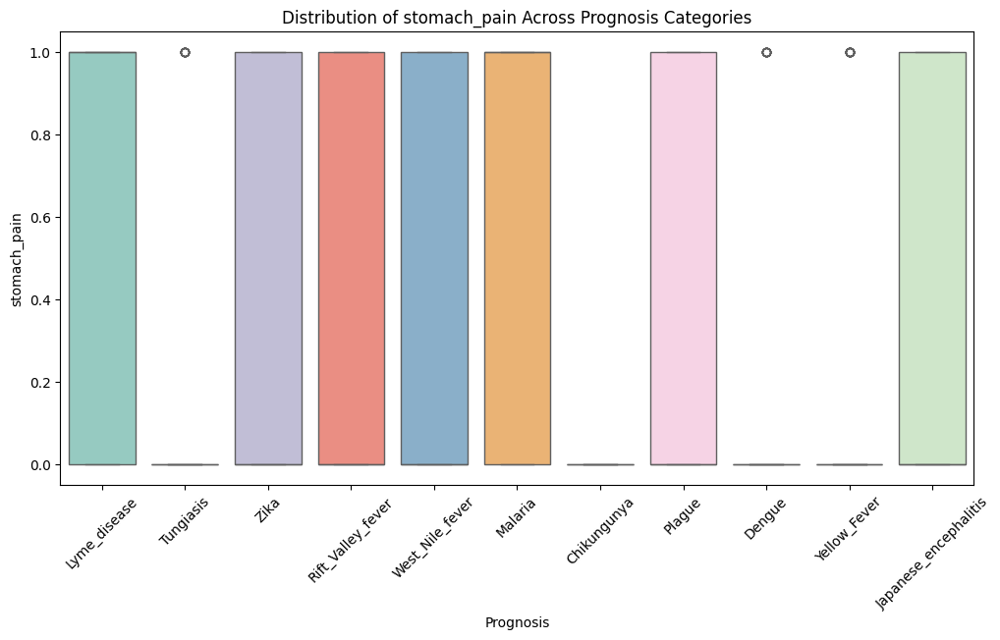

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


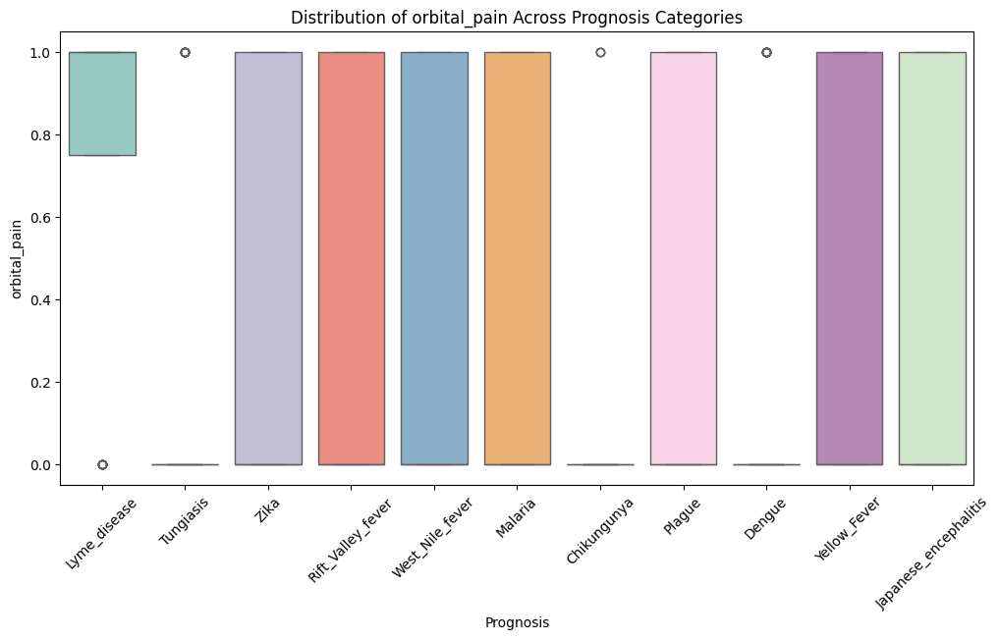

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


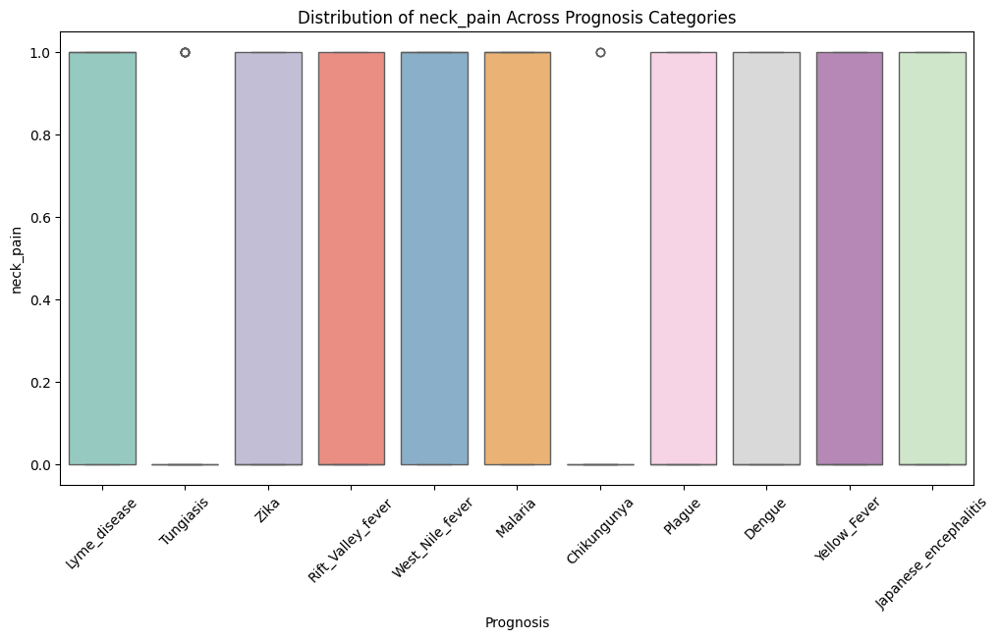

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


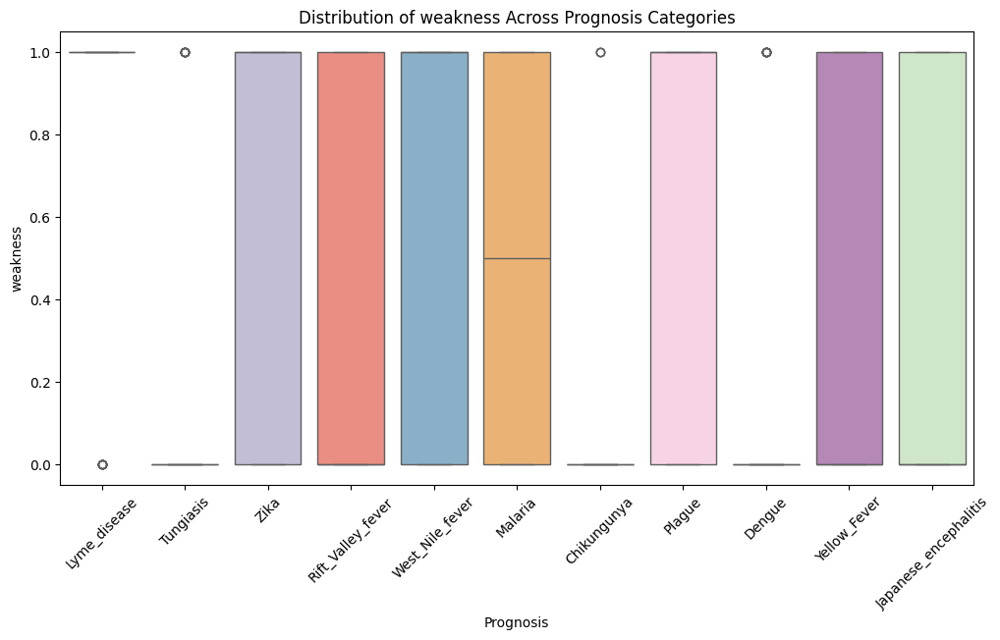

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


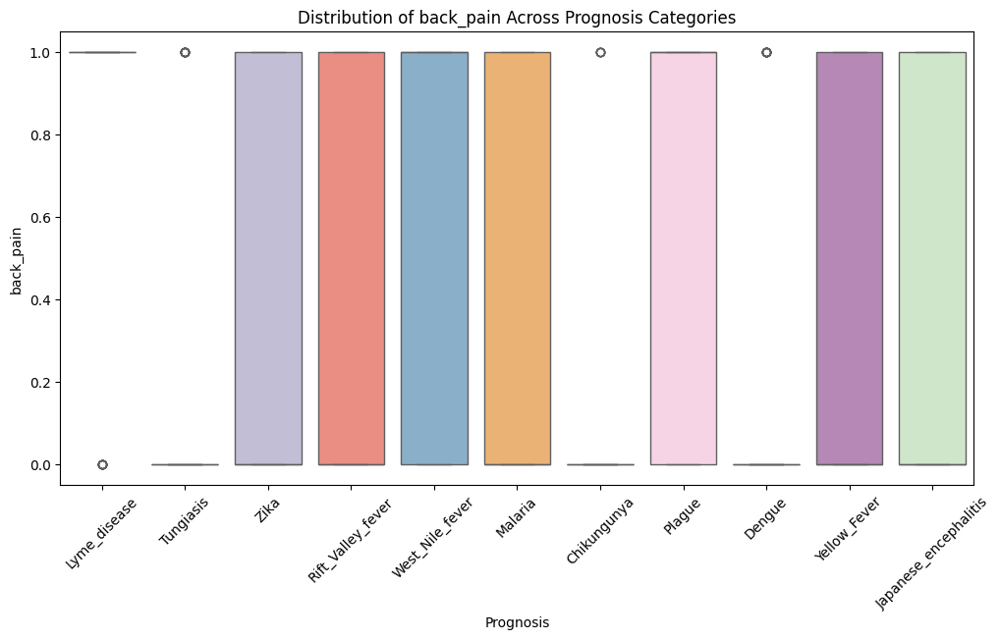

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


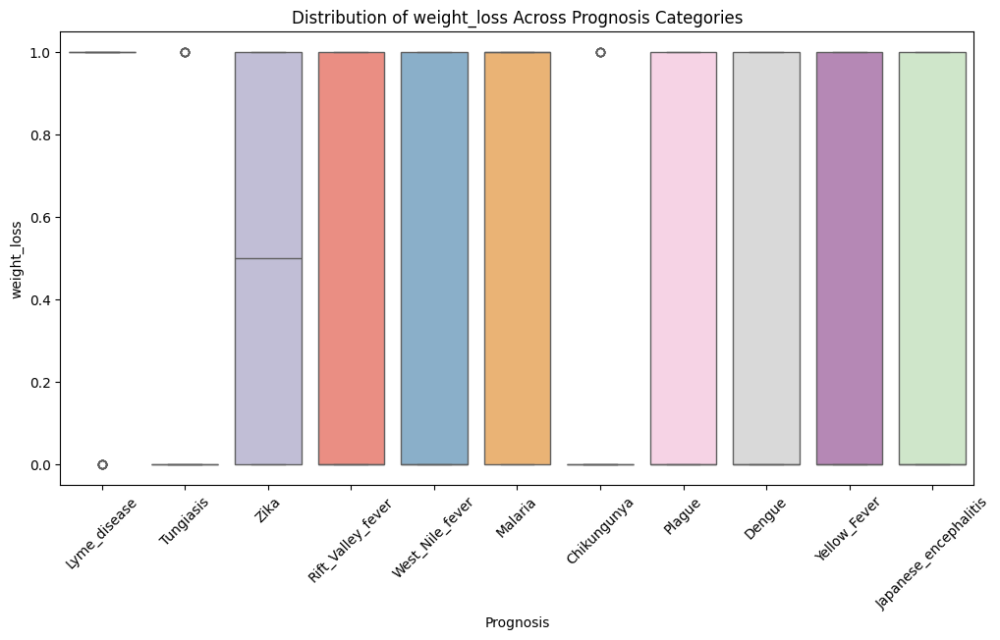

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


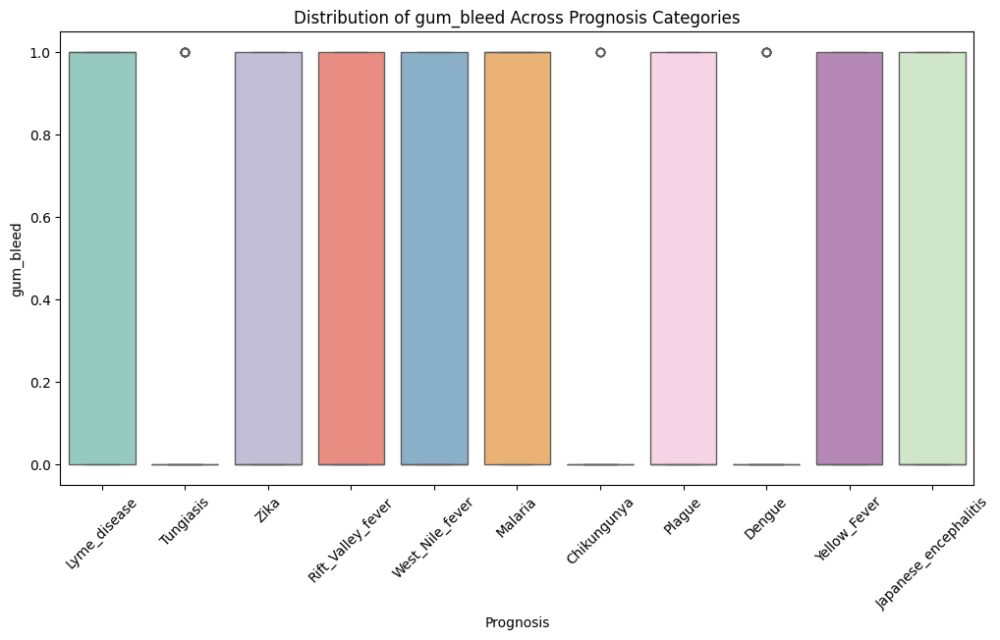

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


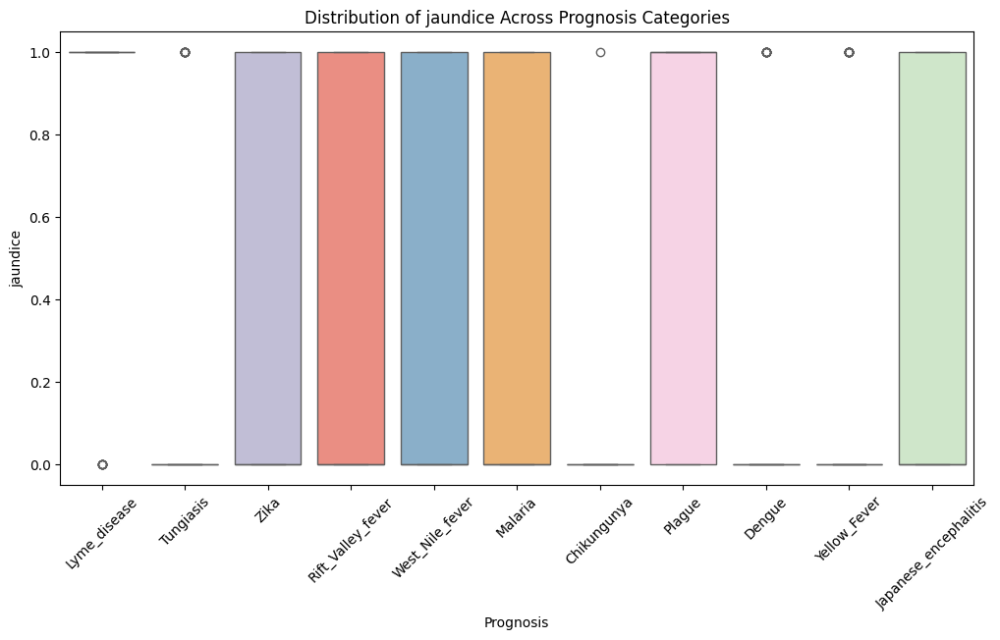

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


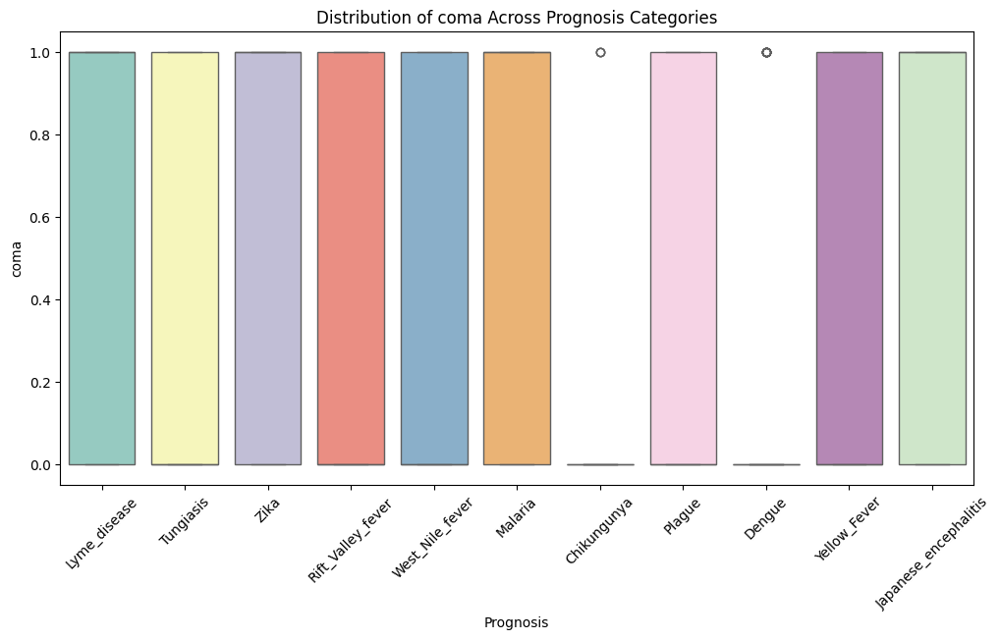

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


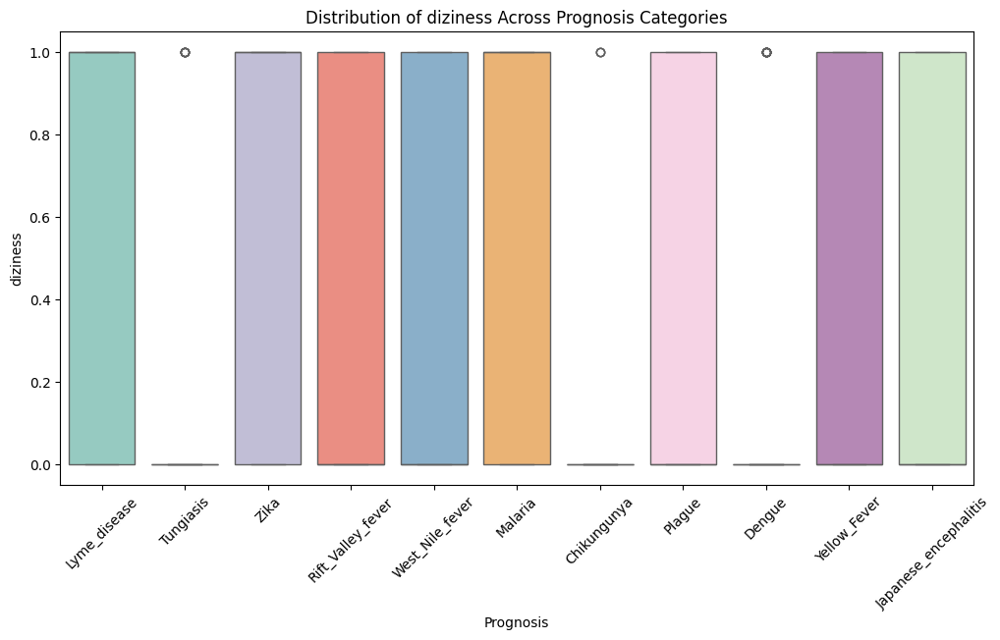

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


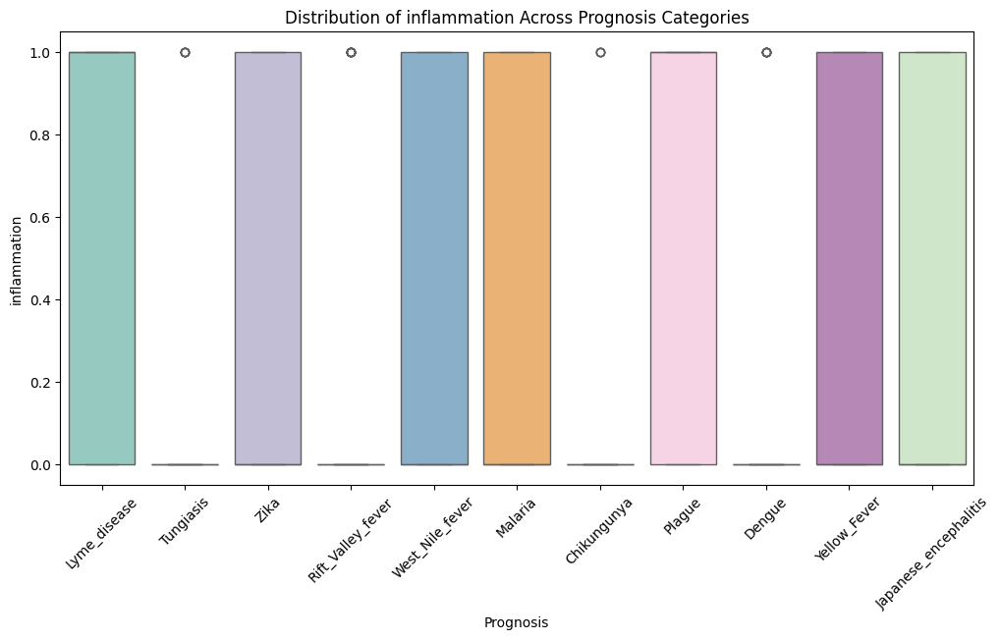

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


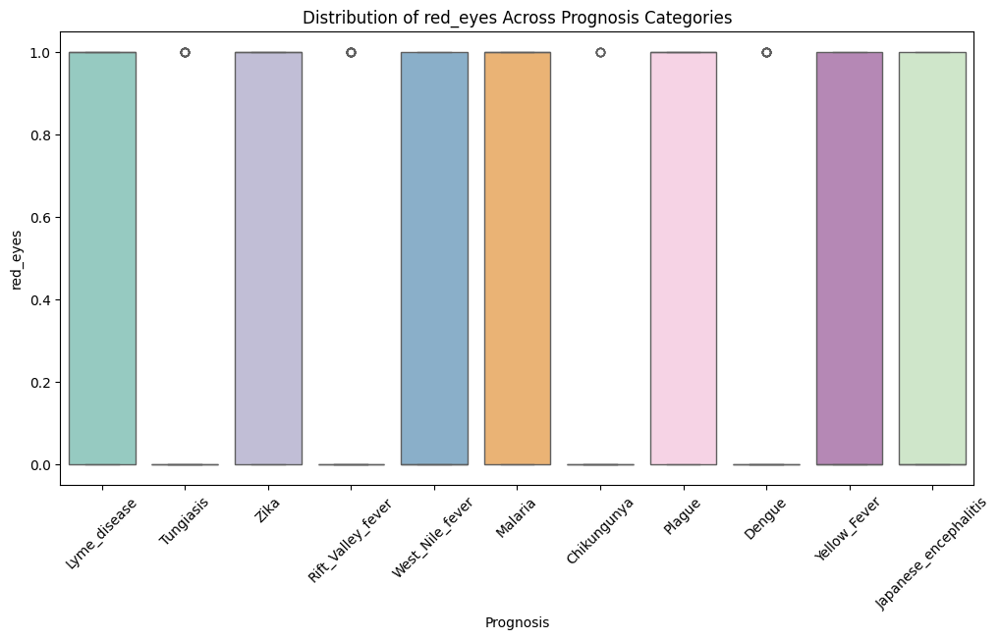

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


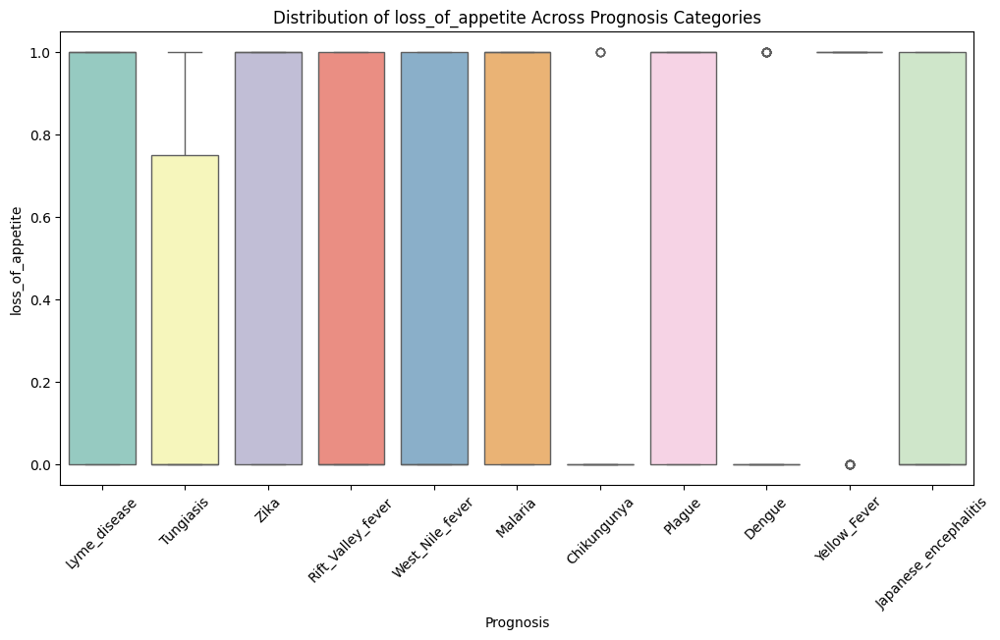

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


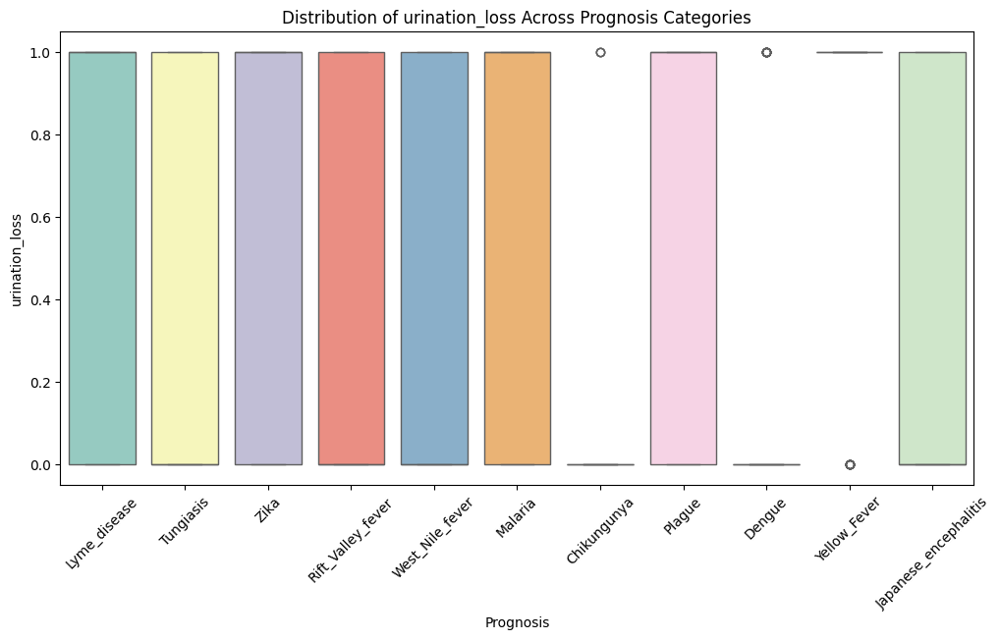

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


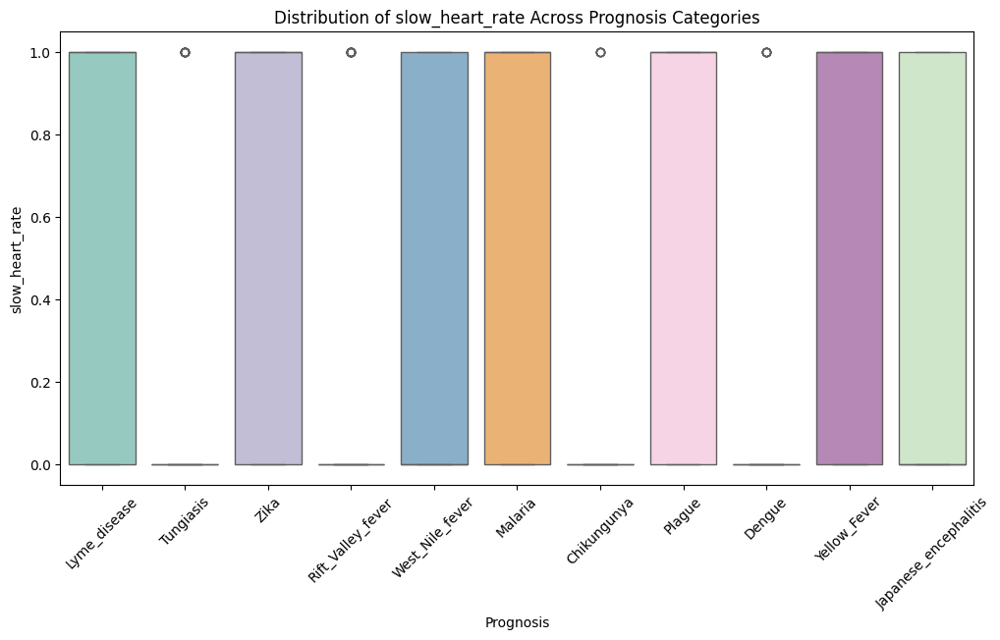

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


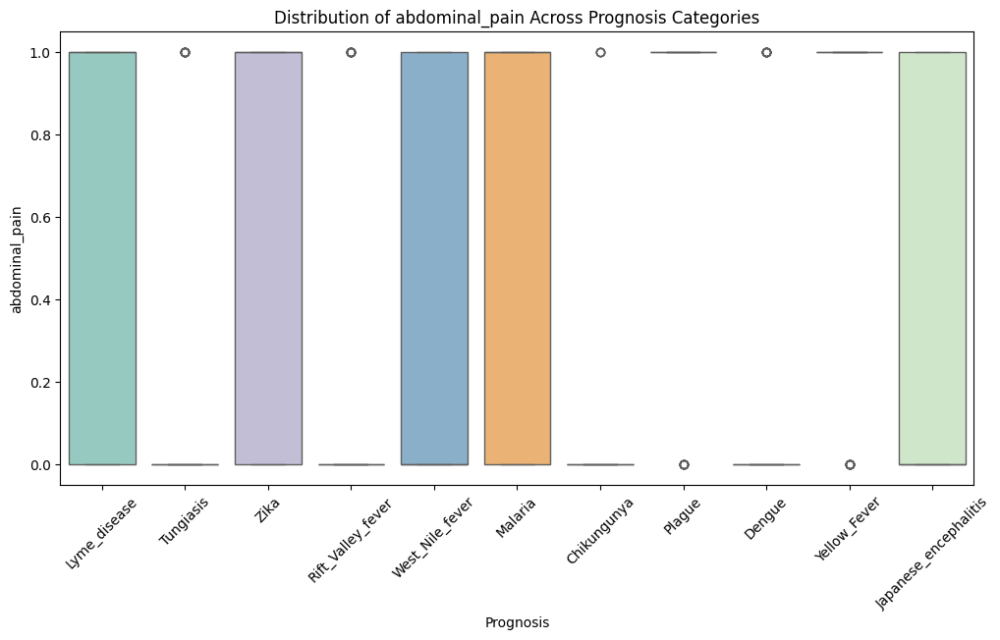

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


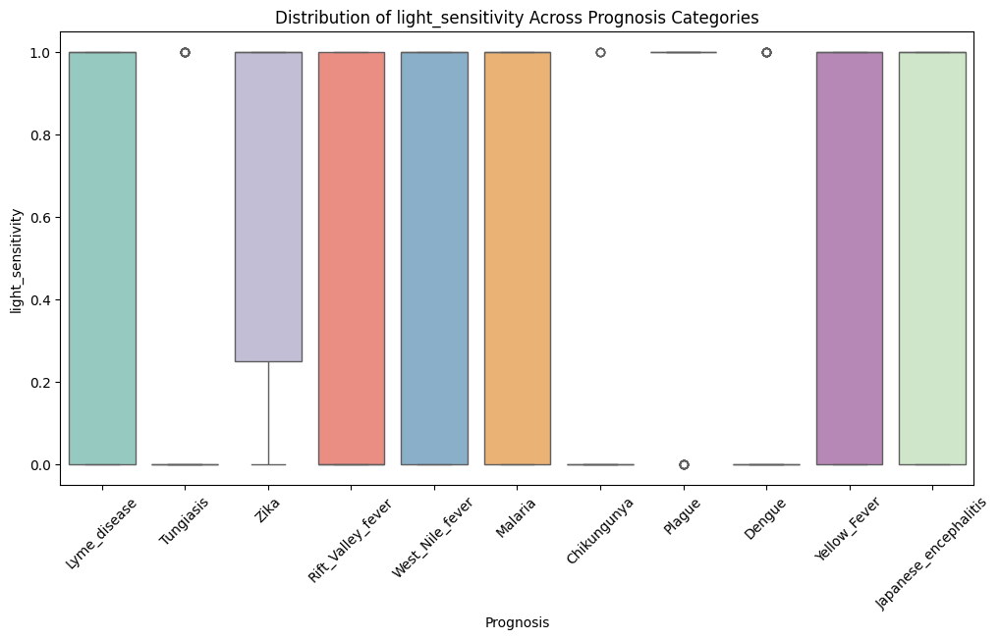

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


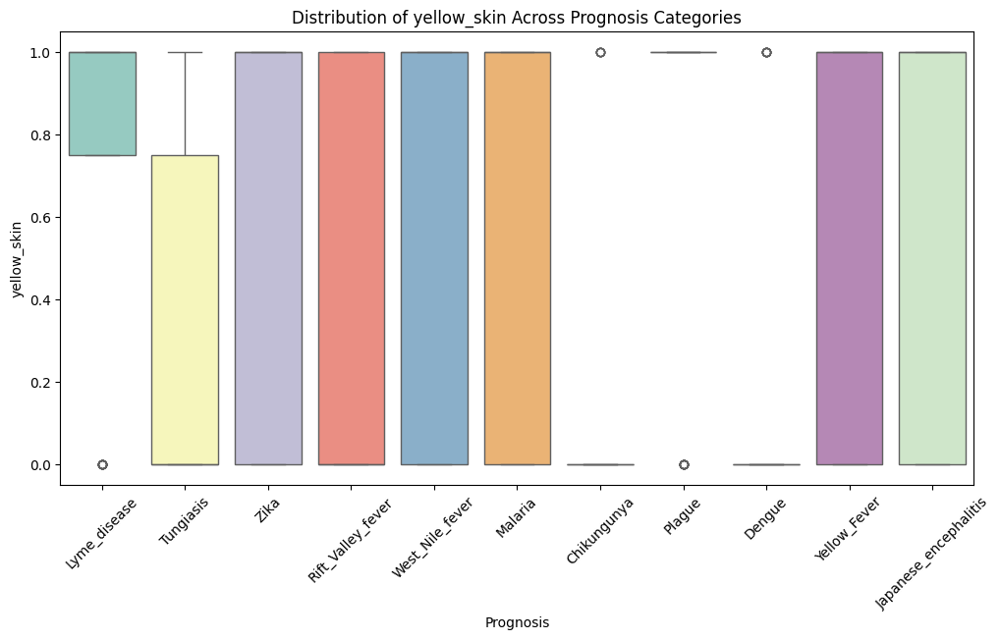

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


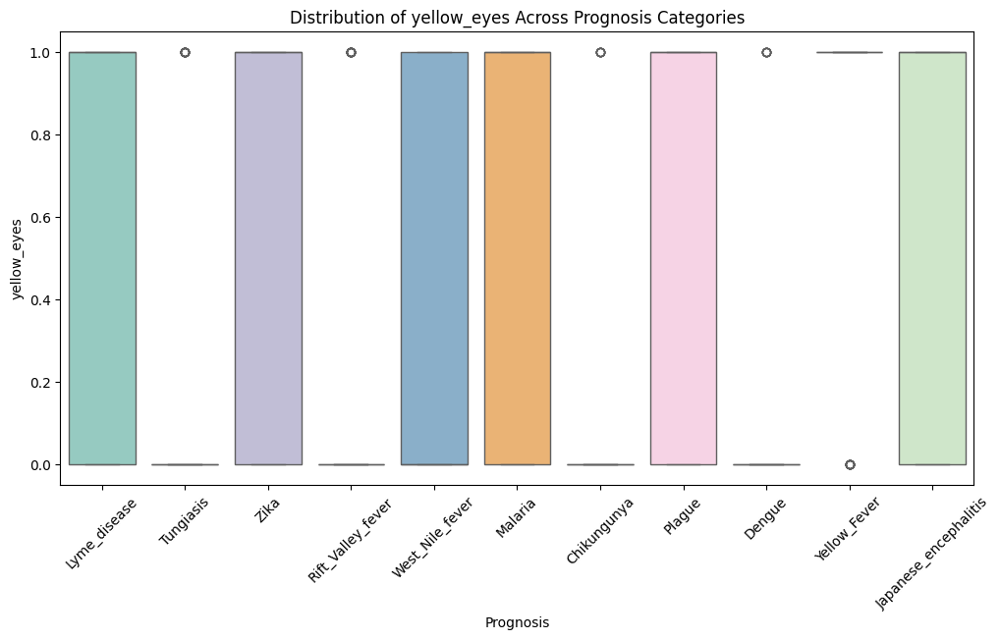

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


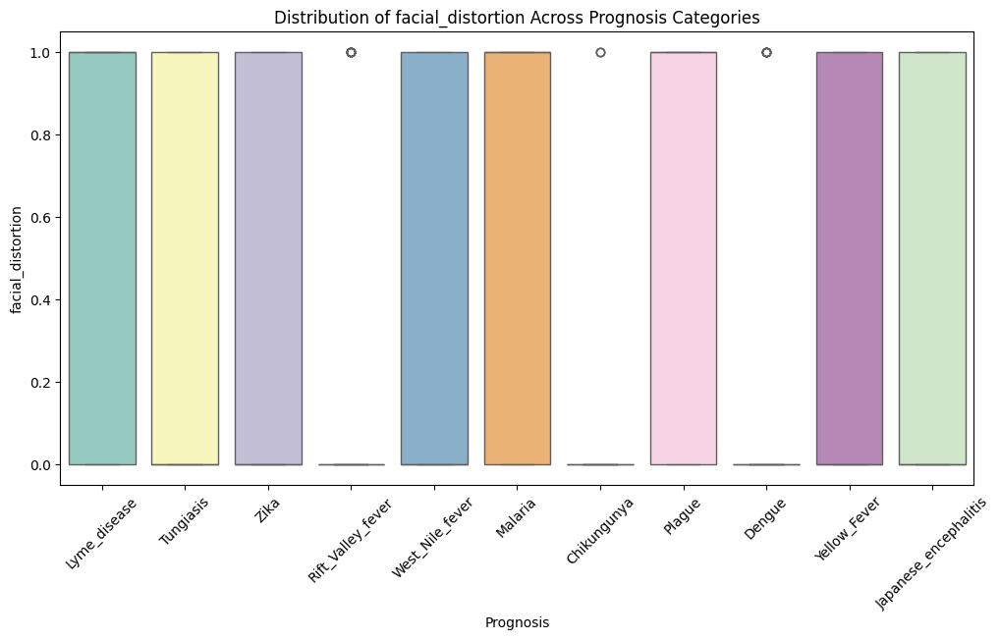

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


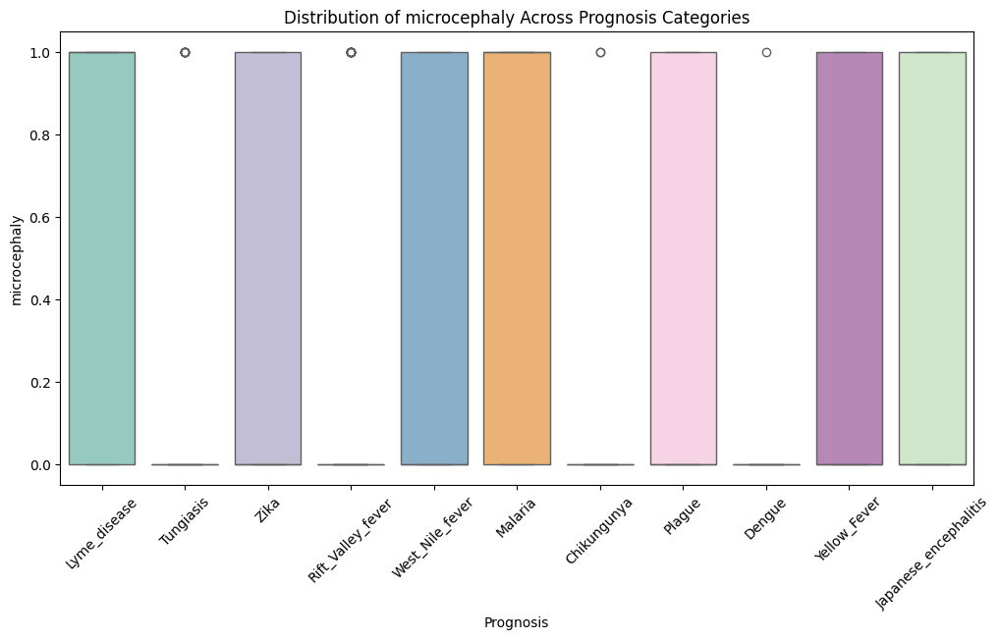

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


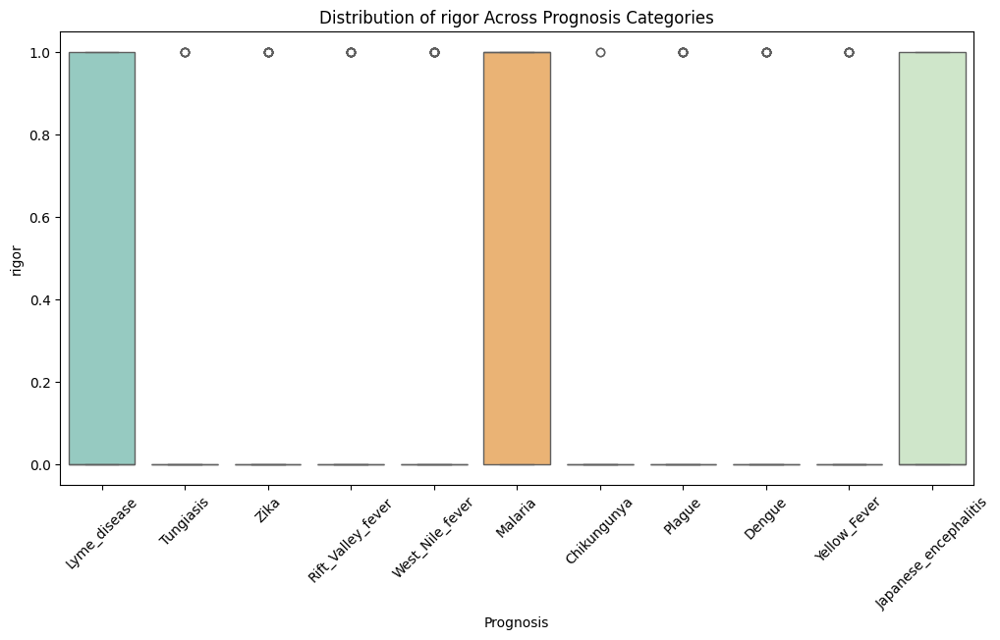

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


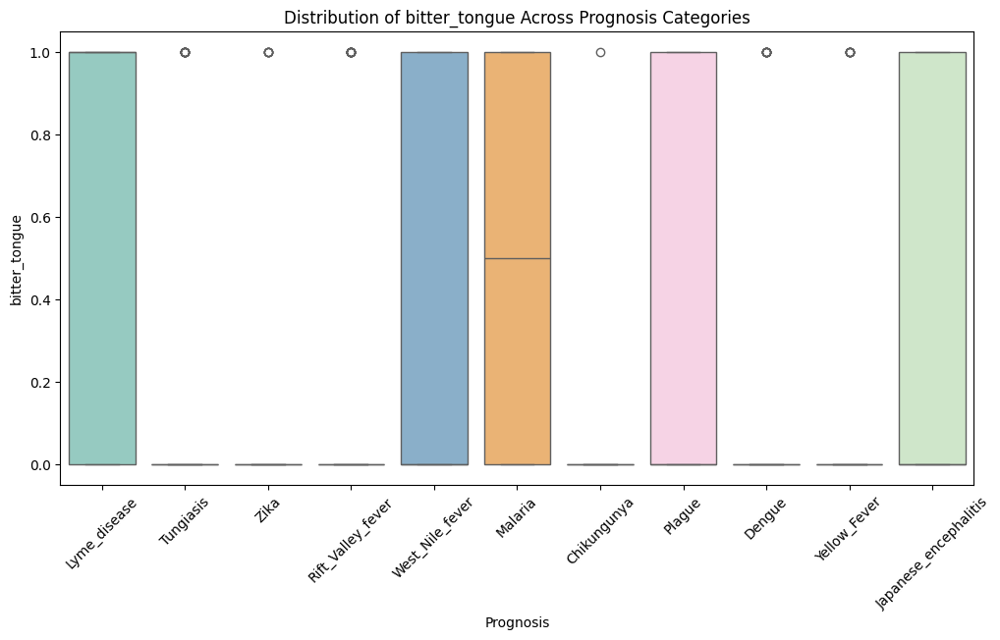

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


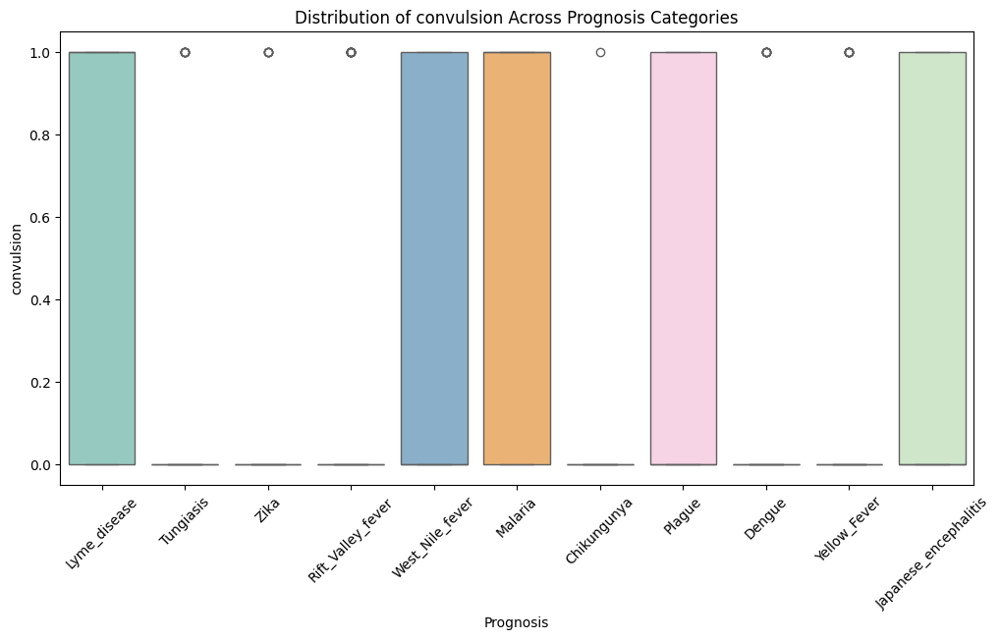

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


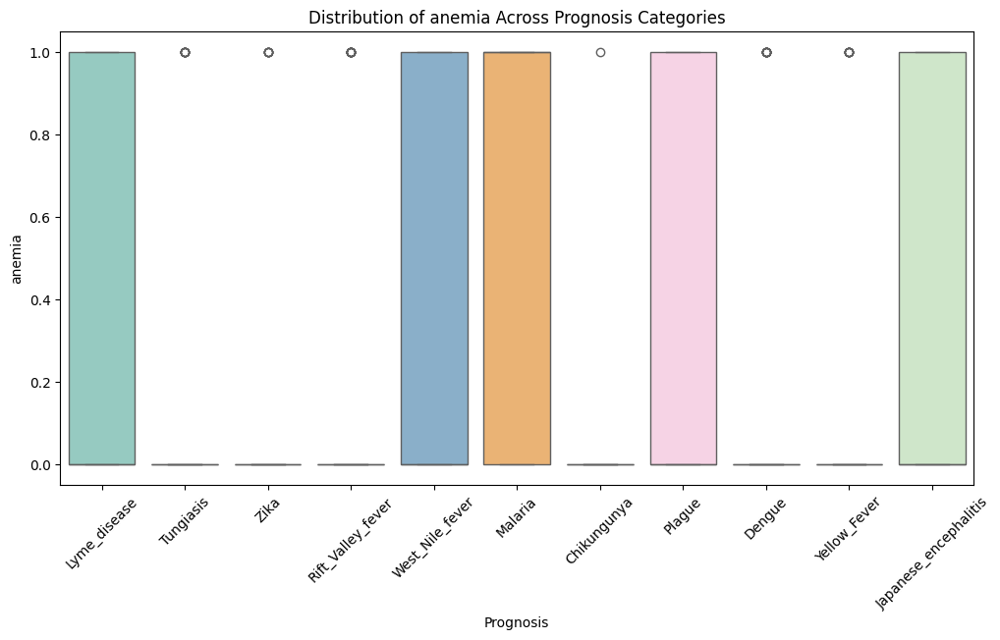

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


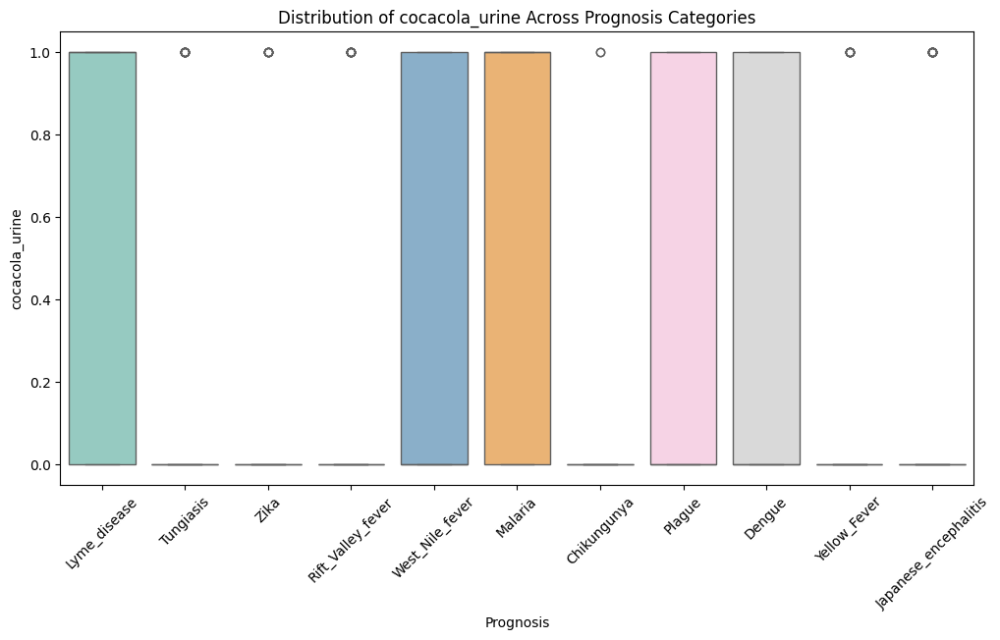

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


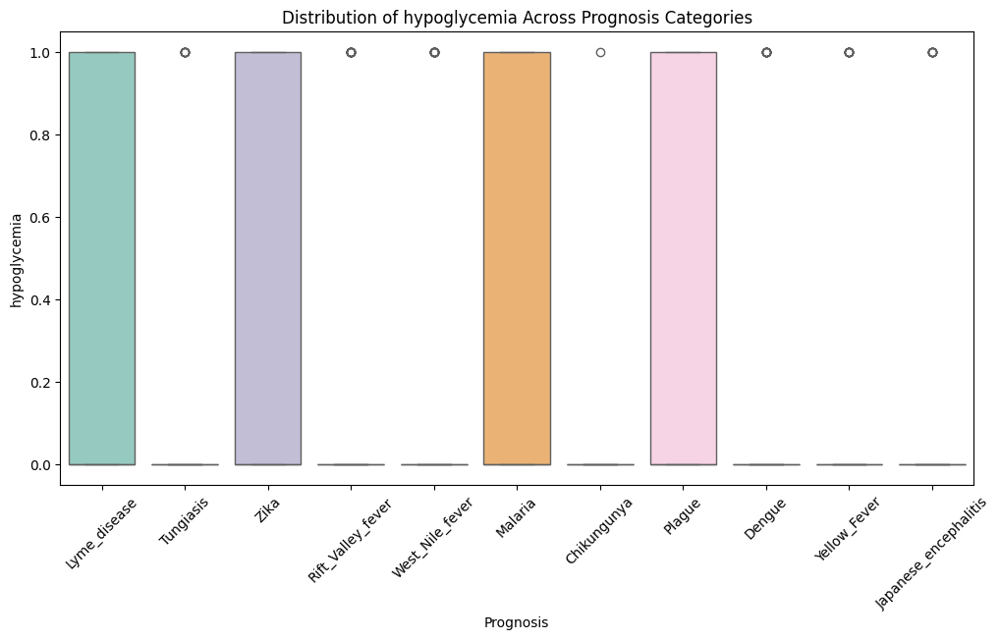

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


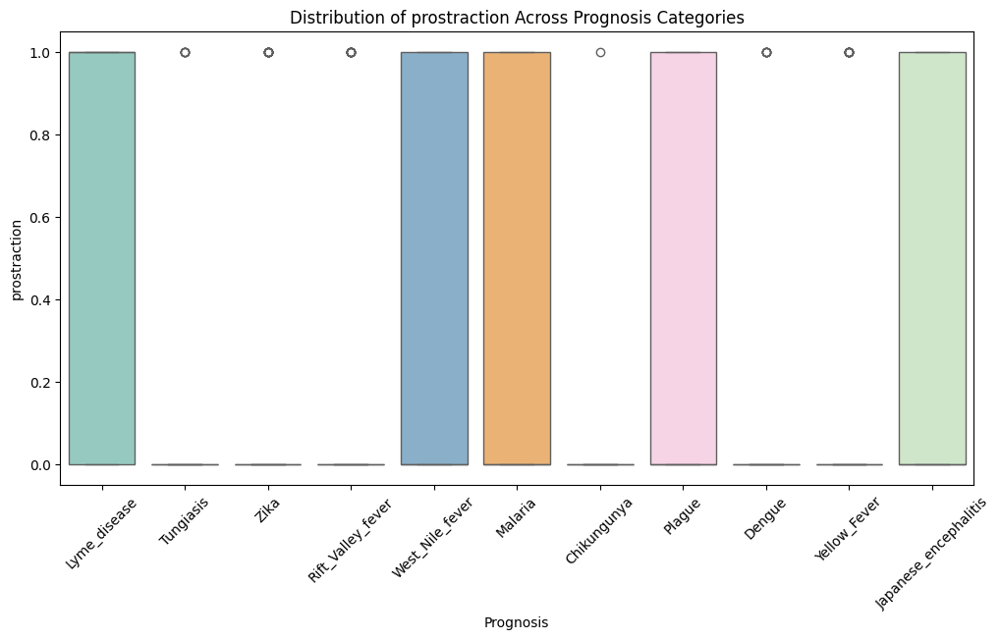

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


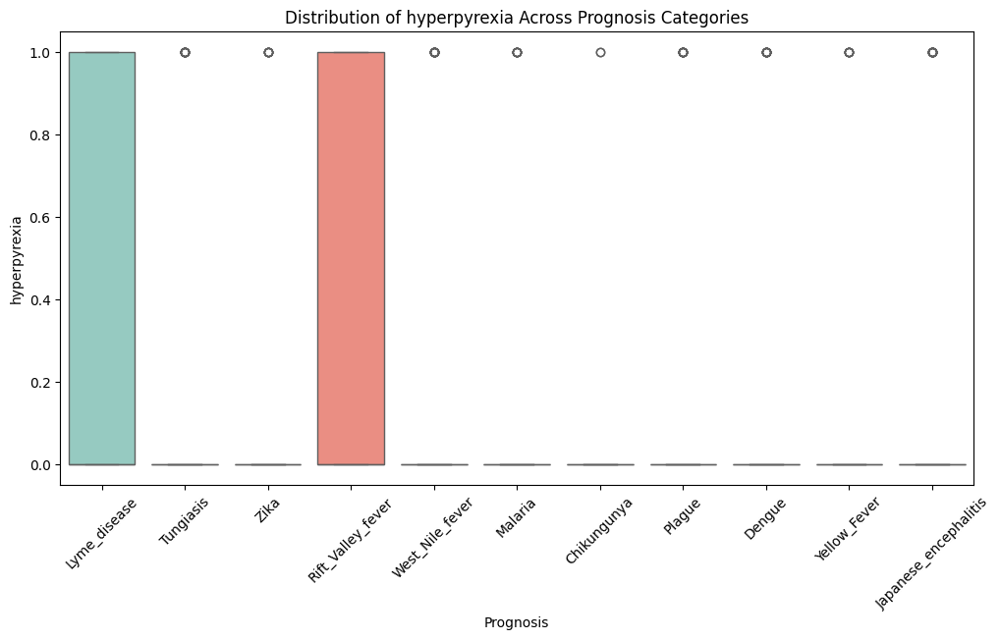

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


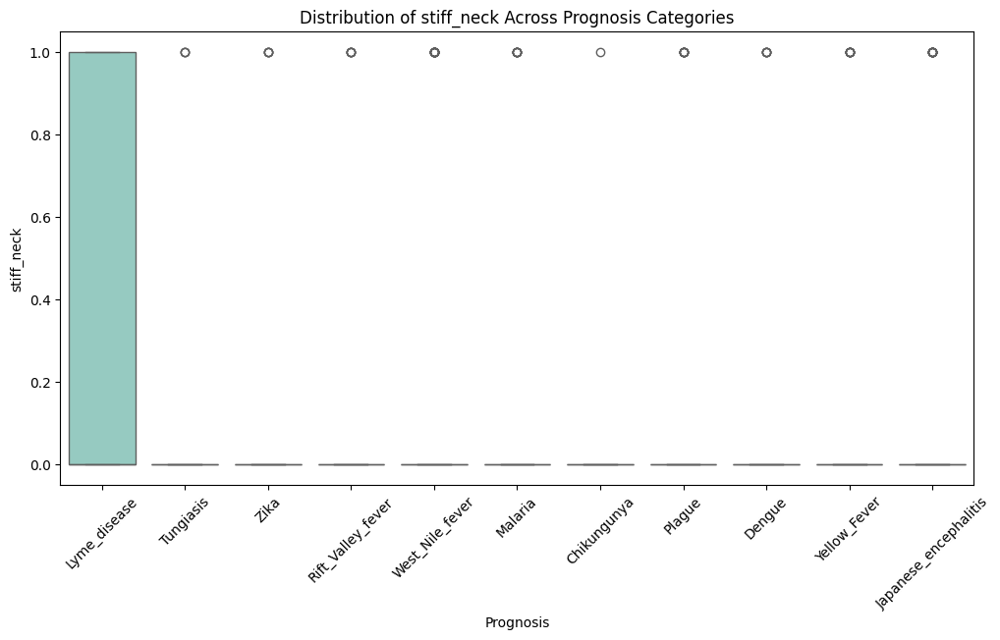

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


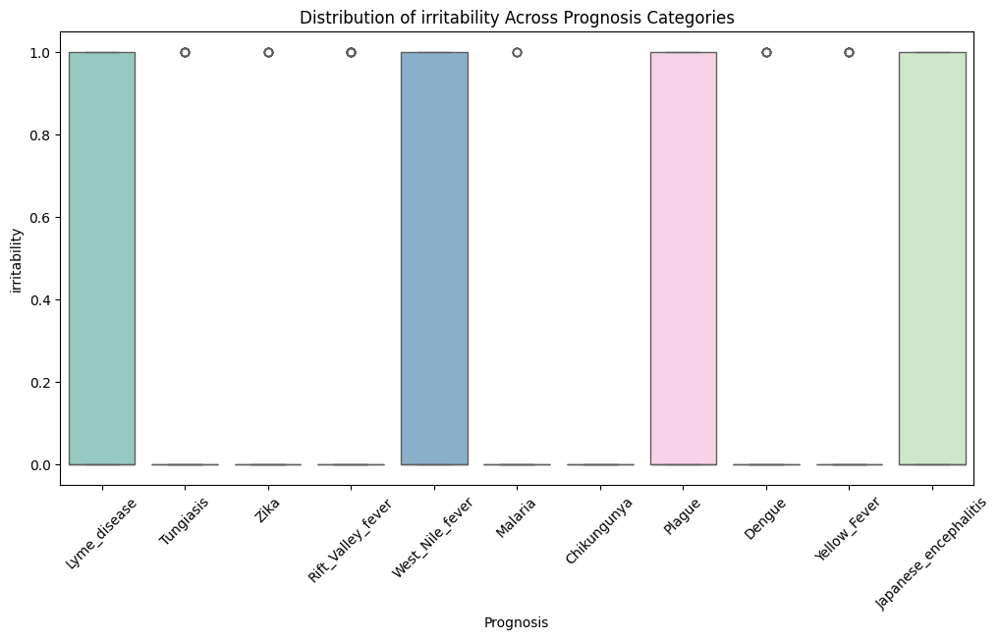

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


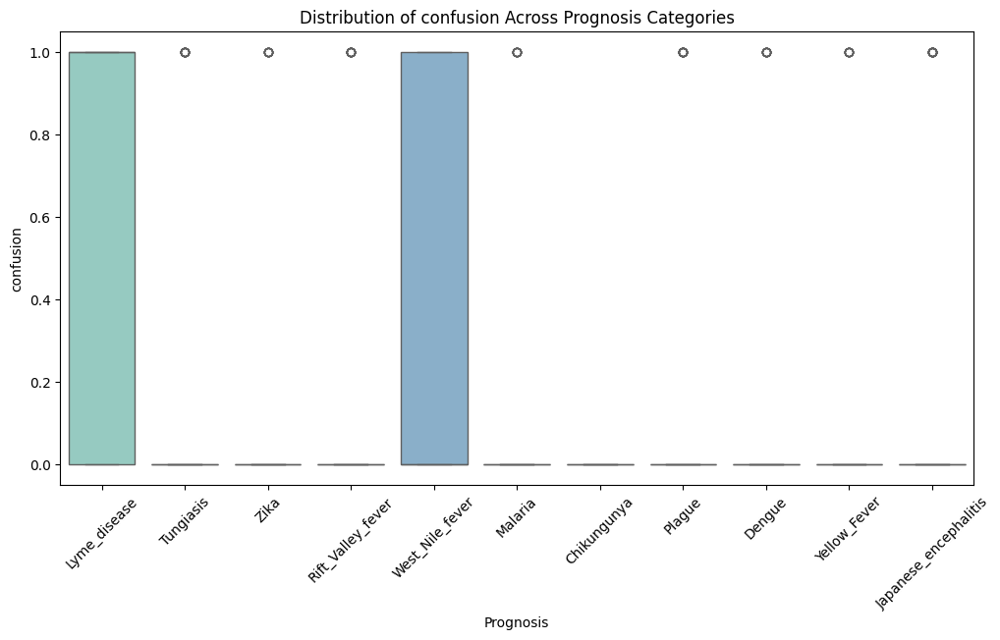

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


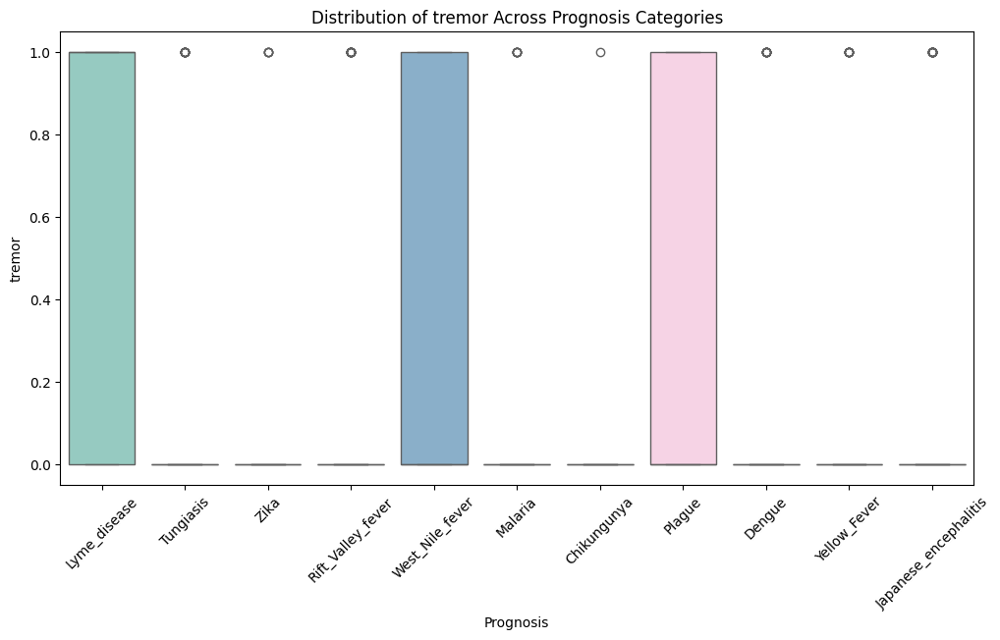

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


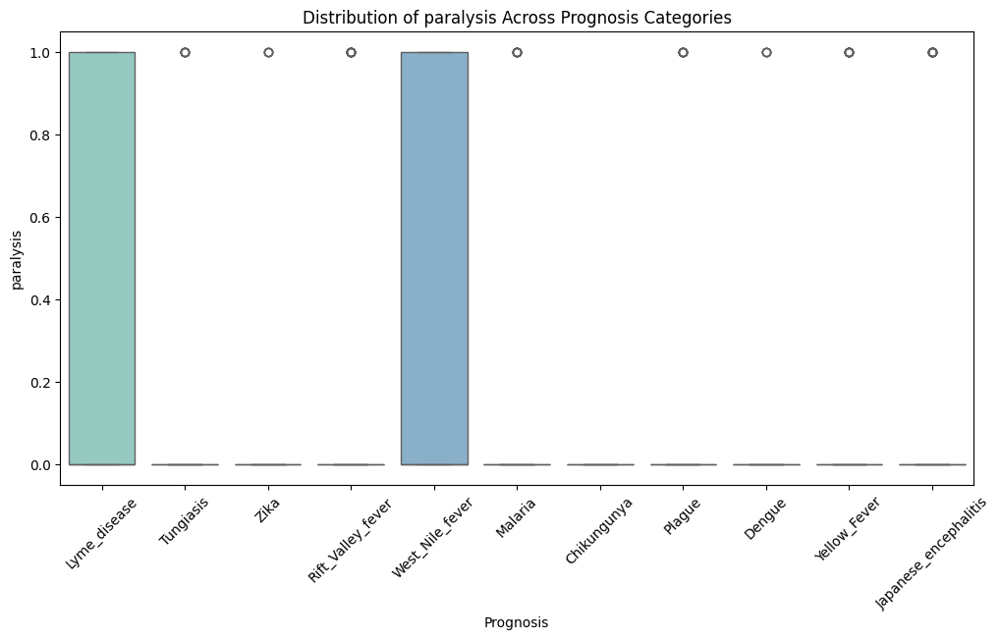

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


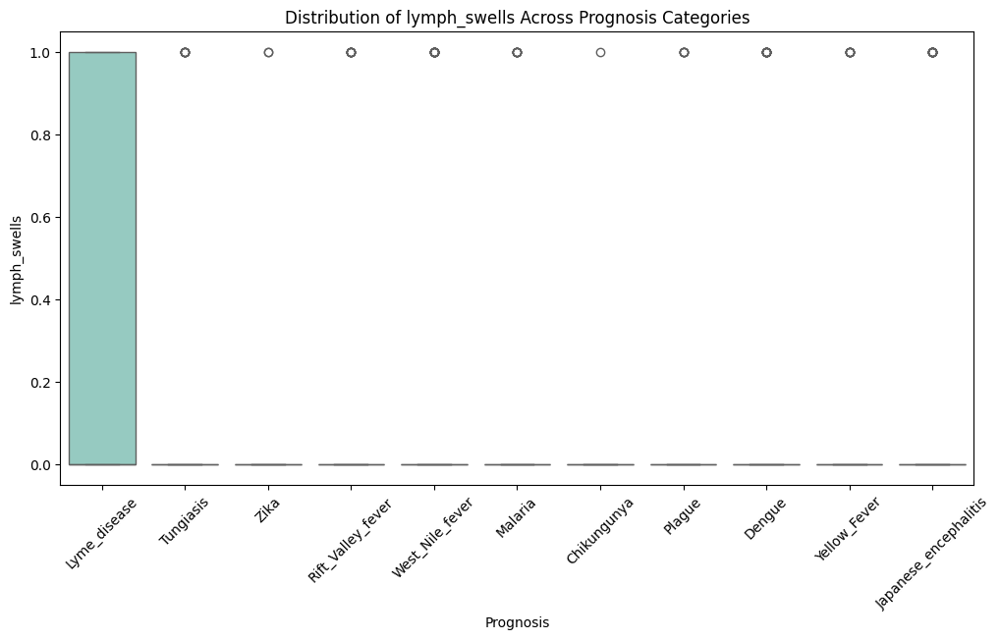

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


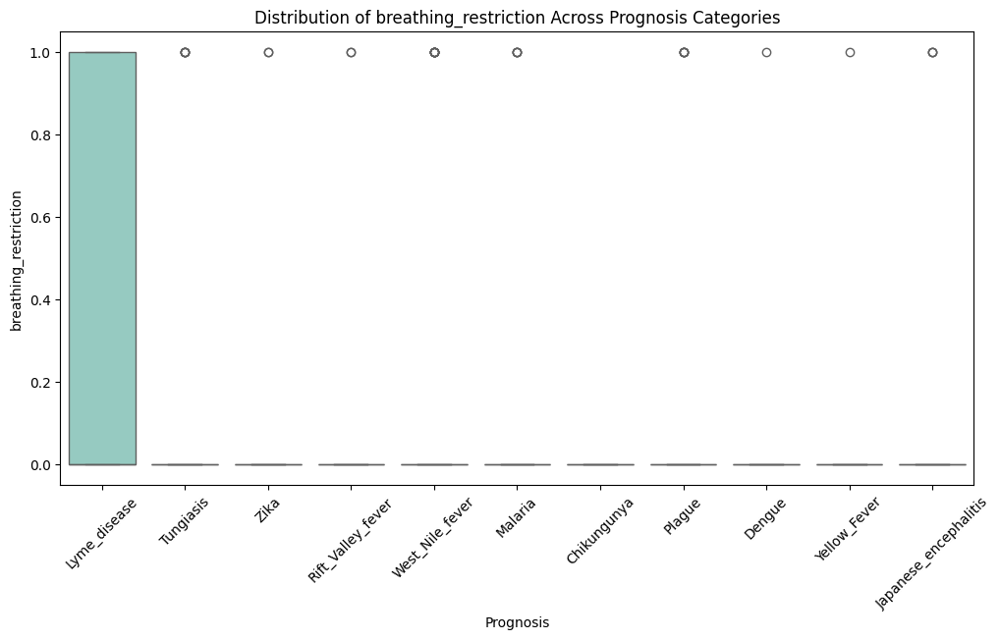

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


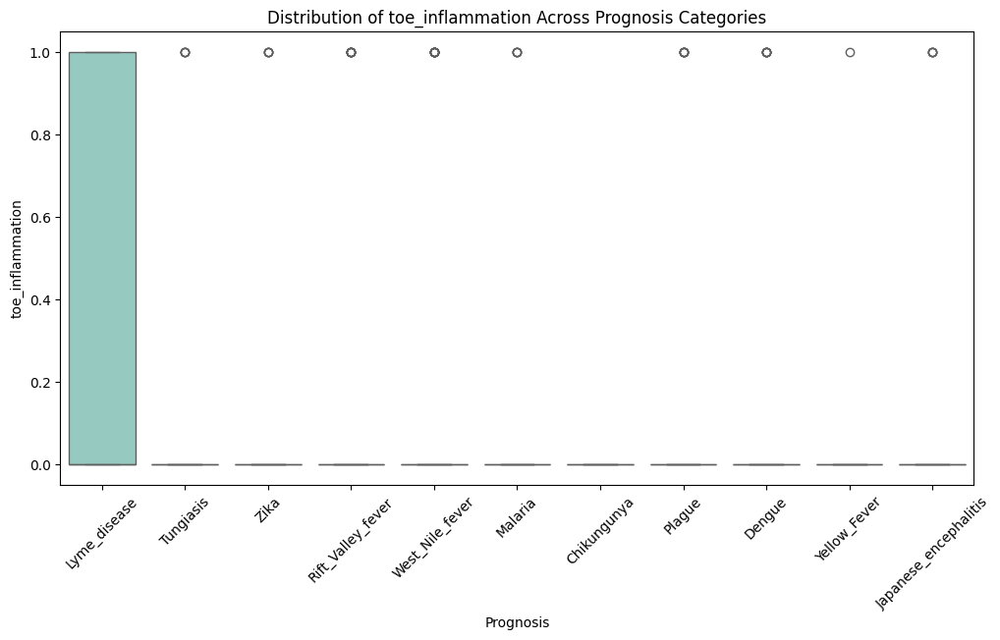

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


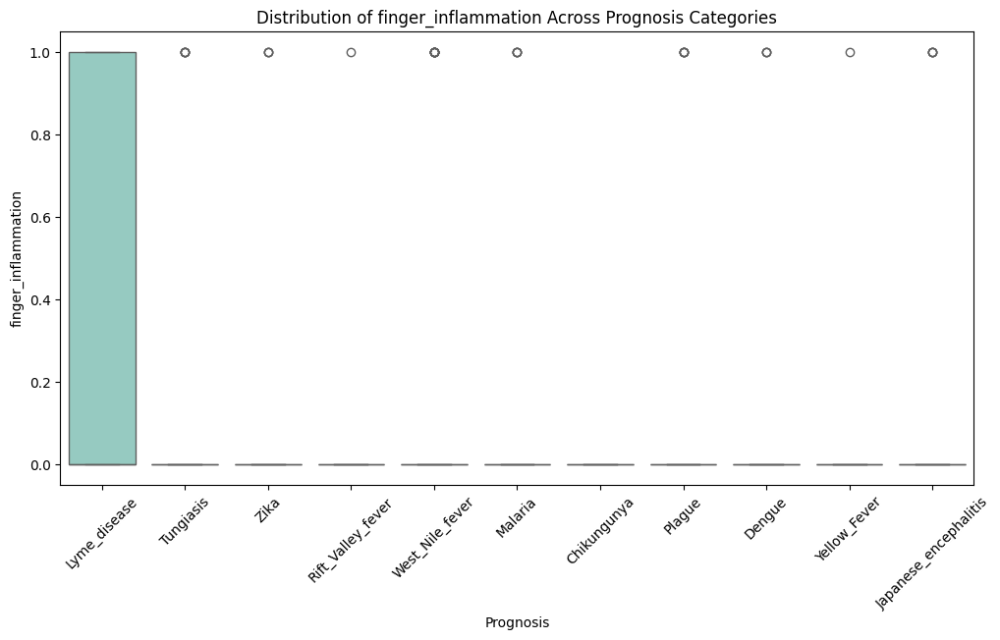

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


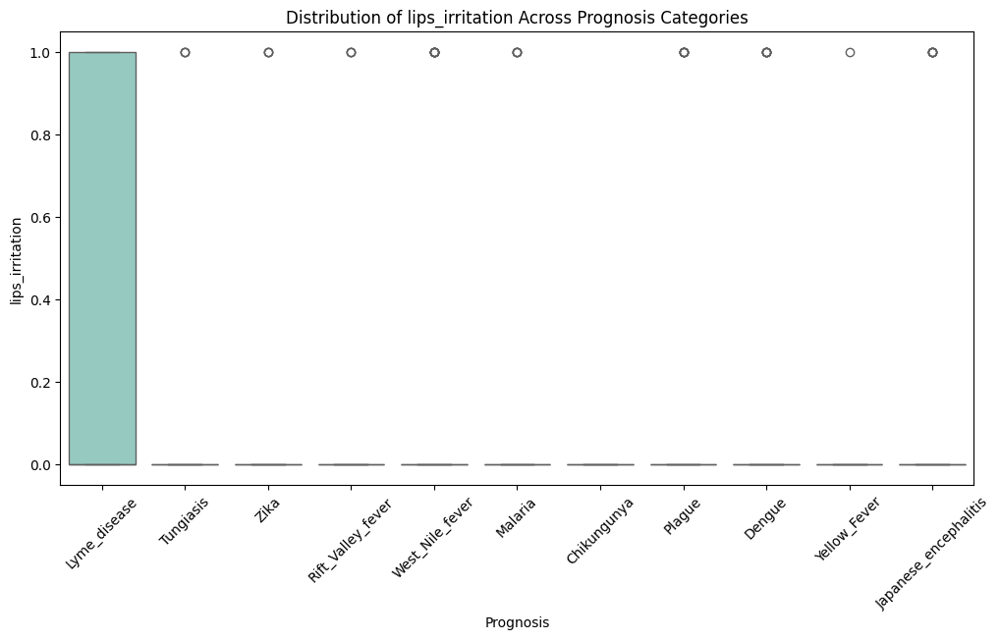

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


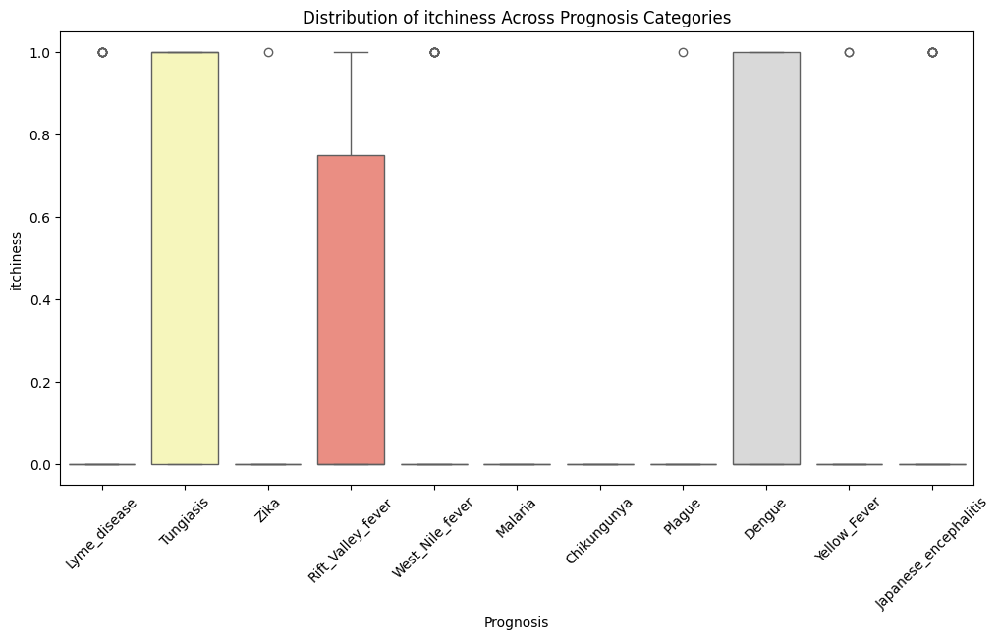

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


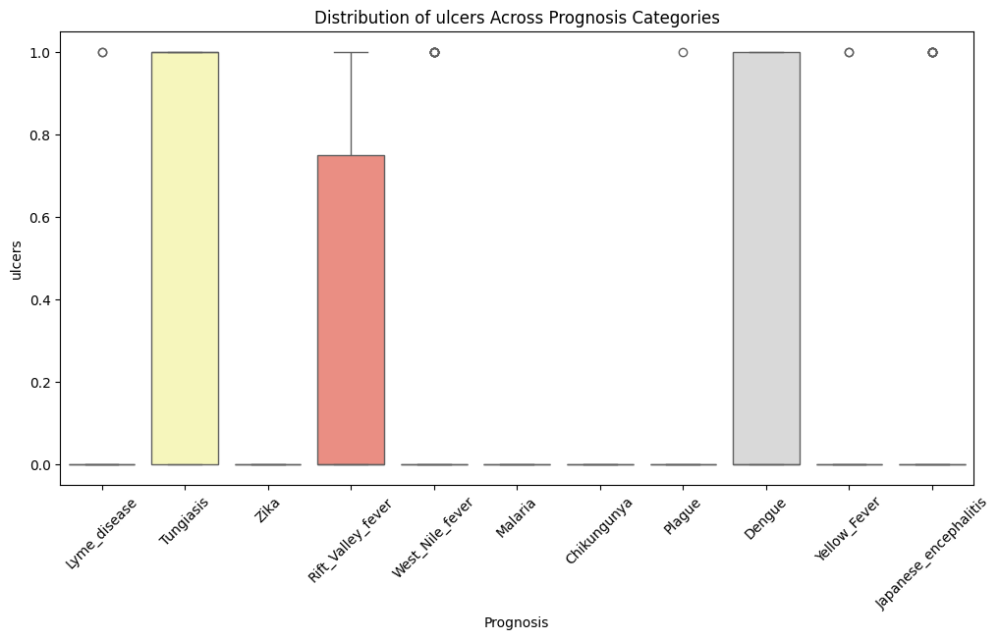

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


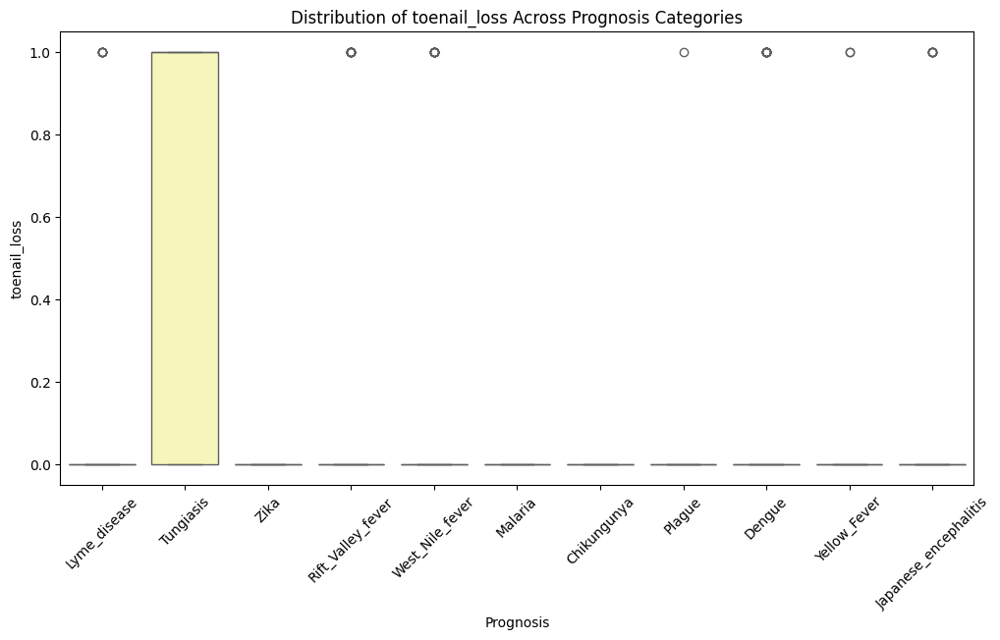

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


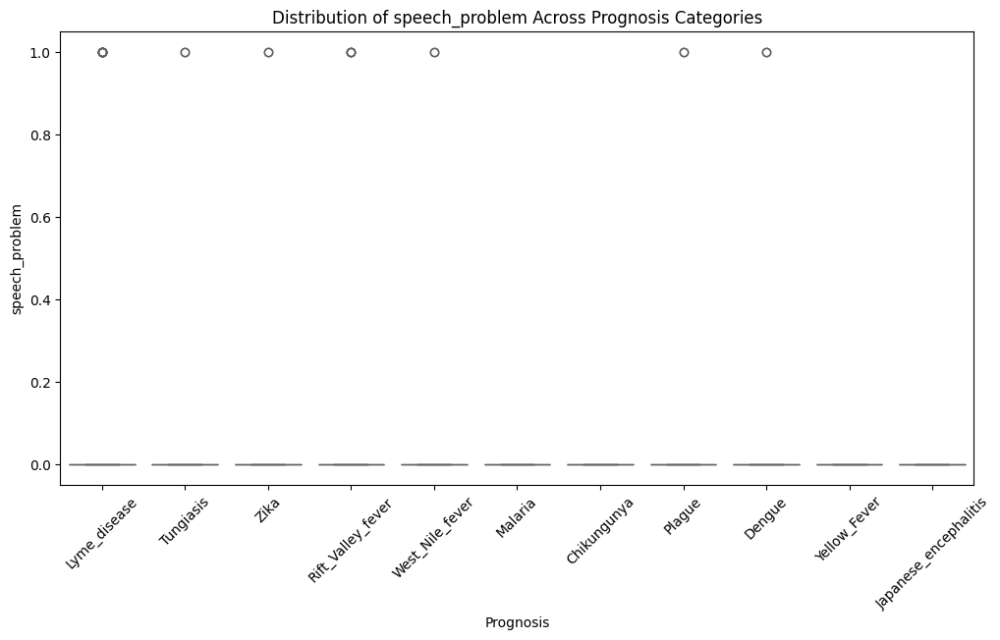

<ipython-input-53-cfb944685587>:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')


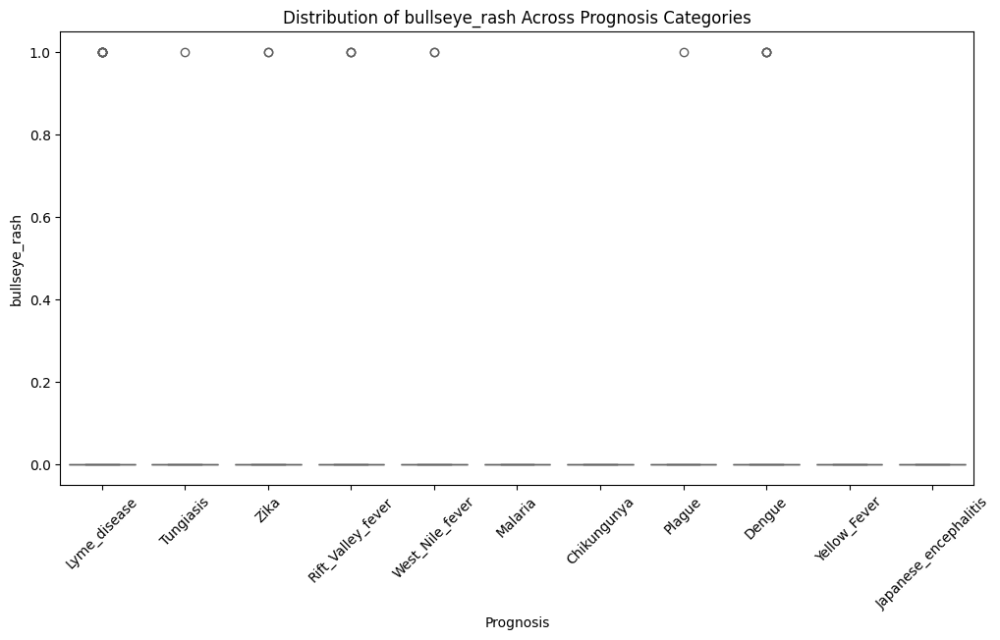

In [ ]:
# Select numerical columns from the dataset
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Generate box plots for each numerical column grouped by the 'prognosis' column
for column in numerical_columns:
    plt.figure(figsize=(12, 6))
    sns.boxplot(x='prognosis', y=column, data=data, palette='Set3')
    plt.title(f'Distribution of {column} Across Prognosis Categories')
    plt.xlabel('Prognosis')
    plt.ylabel(column)
    plt.xticks(rotation=45)
    plt.show()


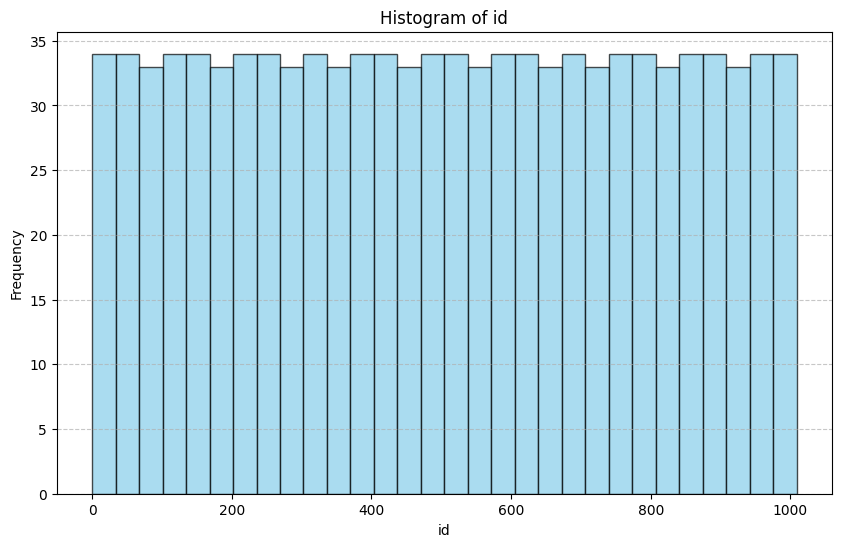

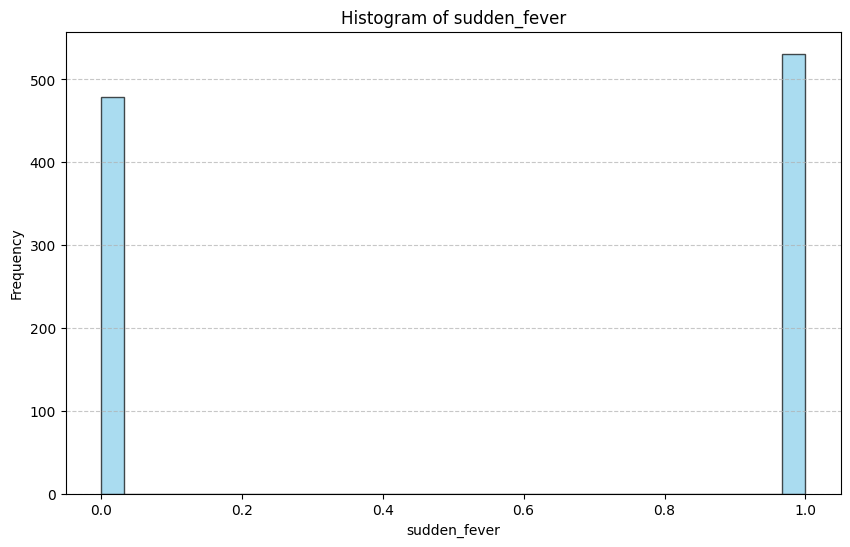

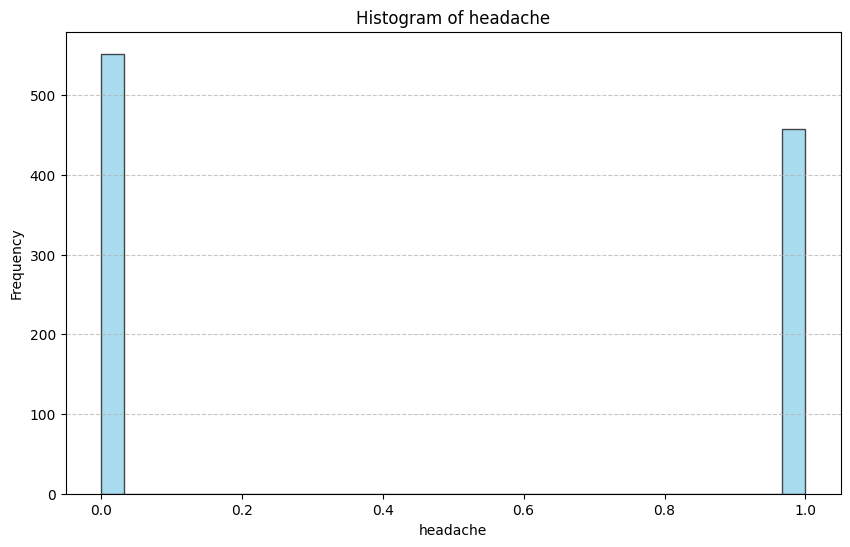

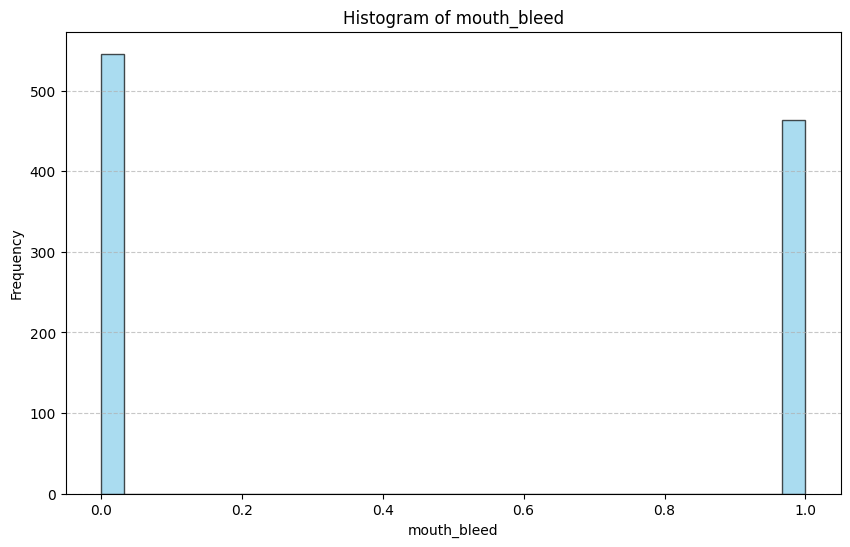

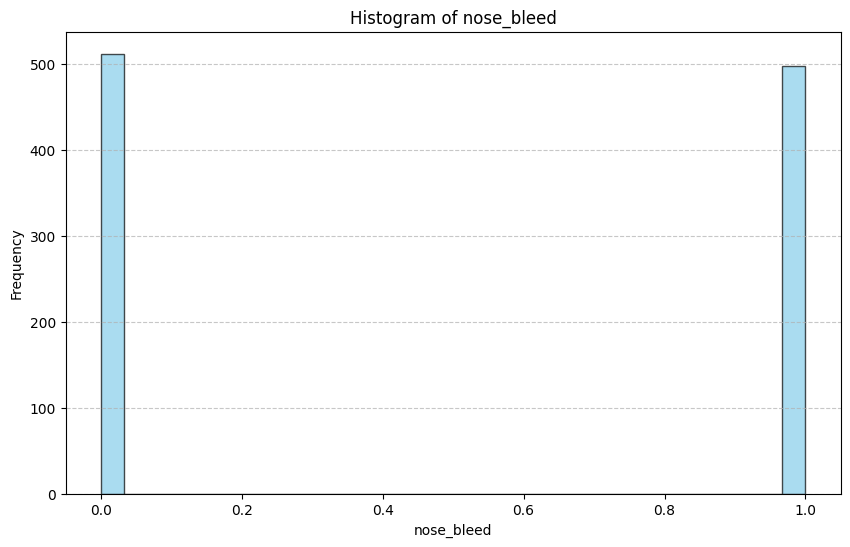

...

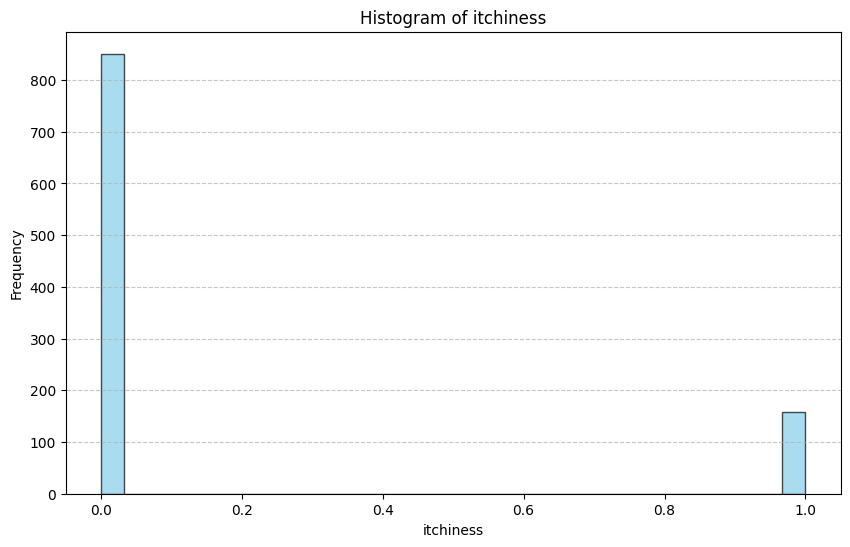

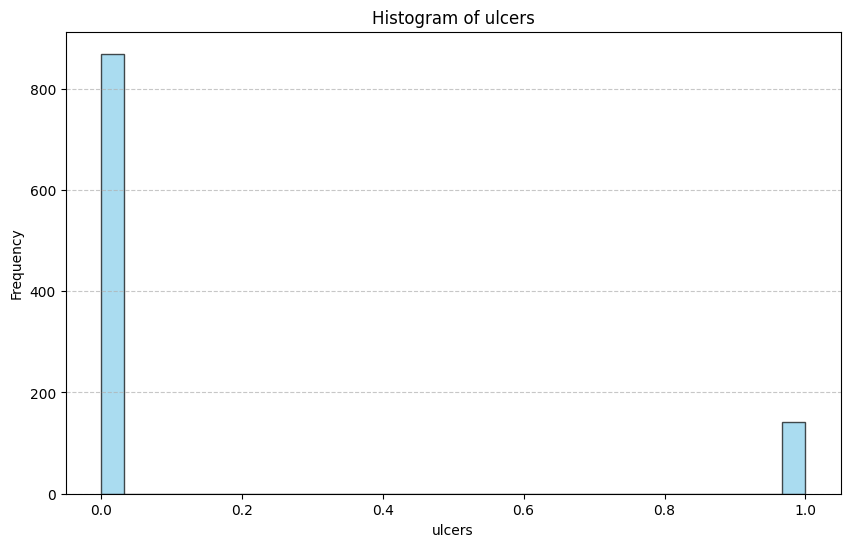

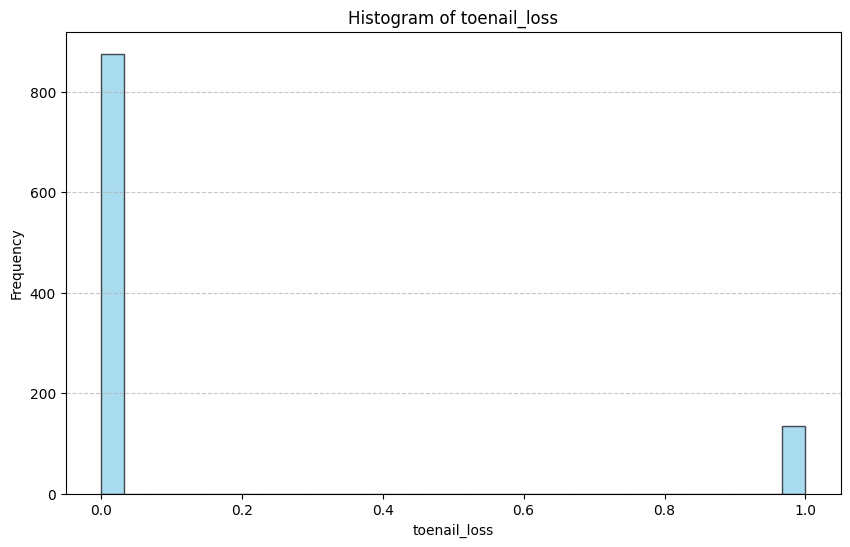

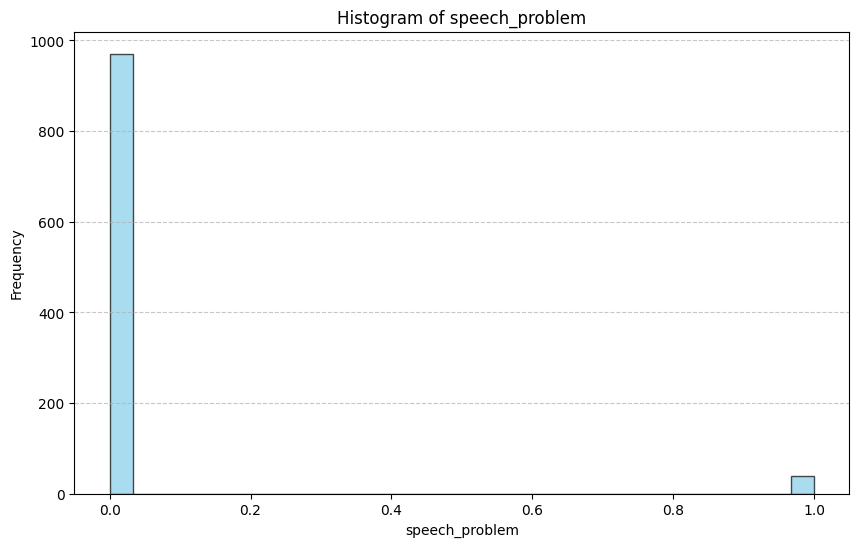

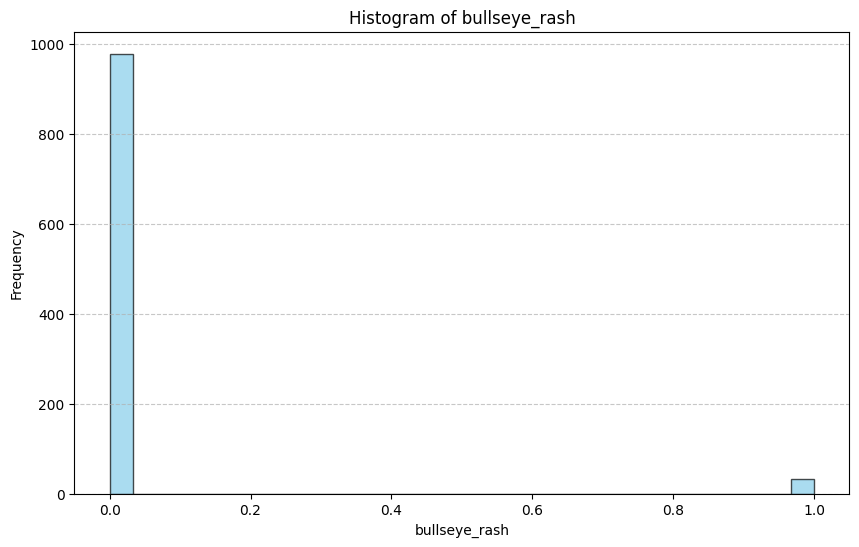

In [ ]:
# Select numerical columns from the dataset
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(10, 6))
    plt.hist(data[column], bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()


In [ ]:
import seaborn as sns

# Select numerical columns for the pair plot
numerical_columns = data.select_dtypes(include=['float64', 'int64']).columns

# Add 'prognosis' to the selected columns for color coding
if 'prognosis' in data.columns:
    columns_for_pairplot = list(numerical_columns) + ['prognosis']
else:
    columns_for_pairplot = list(numerical_columns)

# Filter the dataset for the selected columns
filtered_data = data[columns_for_pairplot]

# Plot the pair plot
sns.set(style="whitegrid")
pair_plot = sns.pairplot(filtered_data, hue='prognosis', diag_kind='kde', palette='Paired', corner=True)

# Show the plot
pair_plot.fig.suptitle("Pair Plot of Numerical Features", y=1.02)  # Adjust title position
plt.show()


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode the prognosis column
label_encoder = LabelEncoder()
data['prognosis_encoded'] = label_encoder.fit_transform(data['prognosis'])


In [ ]:
# Select numeric columns including the encoded prognosis
numeric_columns = data.select_dtypes(include=[np.number])

# Compute correlation with the encoded prognosis
correlation_with_prognosis = numeric_columns.corr()['prognosis_encoded'].sort_values(ascending=False)
print(correlation_with_prognosis)


prognosis_encoded    1.000000
slow_heart_rate      0.233756
urination_loss       0.228385
loss_of_appetite     0.220813
yellow_eyes          0.217251
                       ...   
mouth_bleed         -0.082786
rash                -0.094760
nose_bleed          -0.106424
joint_pain          -0.117271
nausea              -0.169966
Name: prognosis_encoded, Length: 65, dtype: float64


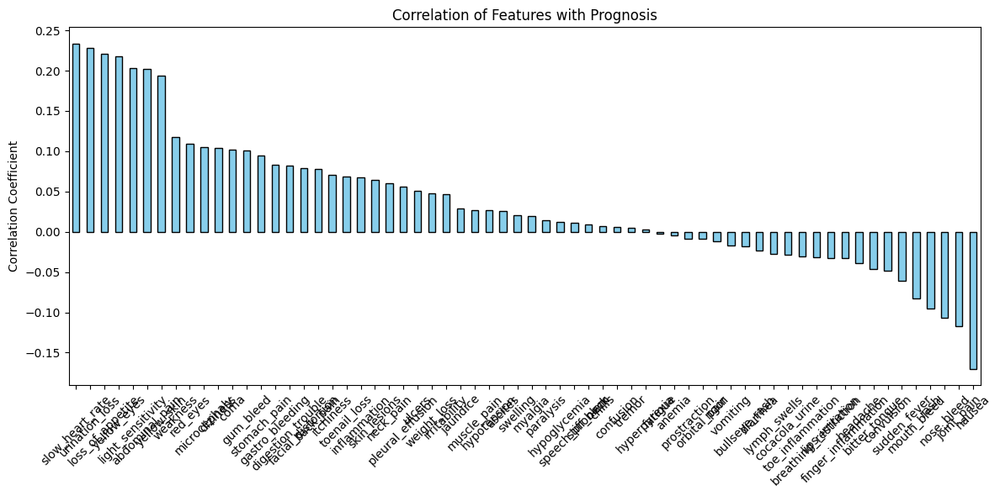

In [ ]:
# Exclude self-correlation (prognosis_encoded with itself)
correlation_with_prognosis = correlation_with_prognosis.drop('prognosis_encoded')

# Plot the correlations
plt.figure(figsize=(12, 6))
correlation_with_prognosis.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Correlation of Features with Prognosis')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


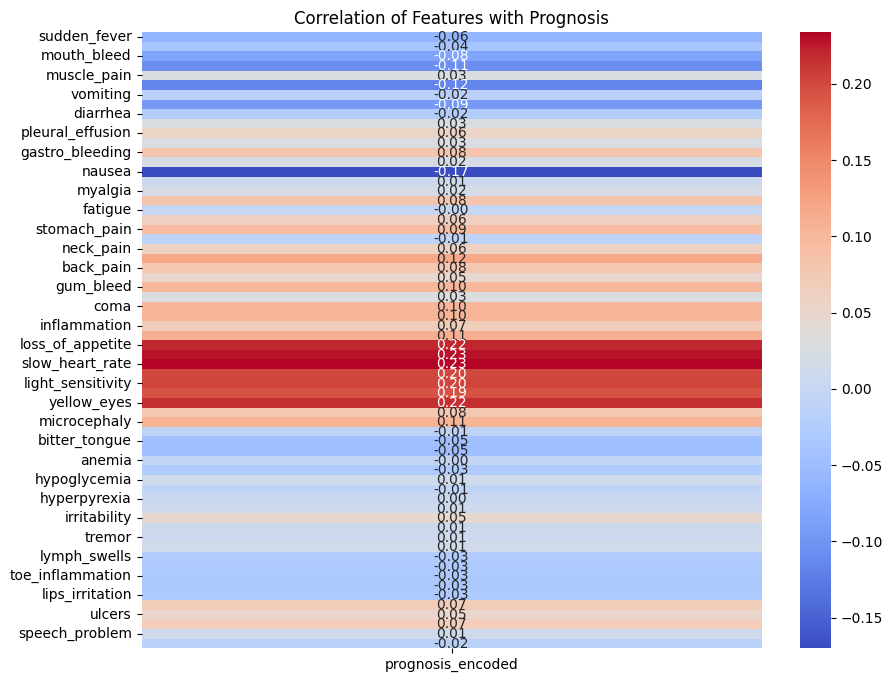

In [ ]:
# Select only features and encoded prognosis
correlation_matrix = numeric_columns.corr()

# Visualize heatmap for features vs prognosis
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[['prognosis_encoded']].drop('prognosis_encoded'),
            annot=True, cmap='coolwarm', fmt=".2f", cbar=True)
plt.title('Correlation of Features with Prognosis')
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split

# Drop rows where the target 'prognosis' is NaN
data_clean = data.dropna(subset=['prognosis'])

# Separate features and target
X = data_clean.drop('prognosis', axis=1)
y = data_clean['prognosis']

# Impute missing values in features (fill with mean)
imputer = SimpleImputer(strategy='mean')
X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)

# Encode the target variable (prognosis) into numerical form
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

# Use RFE with Logistic Regression to select top 30 features
estimator = LogisticRegression(max_iter=1000, random_state=42)
rfe = RFE(estimator, n_features_to_select=30)
rfe.fit(X_imputed, y_encoded)

# Get the top 30 selected features
selected_features = X_imputed.columns[rfe.support_].tolist()

# Subset the data with the selected features
X_top30 = X_imputed[selected_features]

# Standardize the data before applying PCA
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_top30)

# Apply PCA to reduce dimensionality (adjust n_components based on your dataset)
pca = PCA(n_components=0.95)  # Retain 95% of variance
X_pca = pca.fit_transform(X_scaled)

# Split the PCA-transformed data into training and testing sets (80:20 split)
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_encoded, test_size=0.2, random_state=42)

print(f"Top 30 Features (RFE): {selected_features}")
print(f"Original Shape: {X_scaled.shape}, PCA Transformed Shape: {X_pca.shape}")


Top 30 Features (RFE): ['mouth_bleed', 'nose_bleed', 'joint_pain', 'hypotension', 'nausea', 'digestion_trouble', 'fatigue', 'weakness', 'back_pain', 'weight_loss', 'jaundice', 'coma', 'diziness', 'inflammation', 'abdominal_pain', 'yellow_skin', 'yellow_eyes', 'anemia', 'cocacola_urine', 'hypoglycemia', 'stiff_neck', 'irritability', 'confusion', 'tremor', 'paralysis', 'lips_irritation', 'itchiness', 'ulcers', 'toenail_loss', 'prognosis_encoded']
Original Shape: (3333, 30), PCA Transformed Shape: (3333, 25)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import seaborn as sns

# Load the data
file_path = '/content/drive/MyDrive/ML_Project/DiseaseData - Sheet1.csv'  # Replace with the actual file path
data = pd.read_csv(file_path)

# Define the top 30 features (excluding the target 'prognosis')
top_30_features = [
    'mouth_bleed', 'nose_bleed', 'joint_pain', 'hypotension', 'nausea', 'digestion_trouble',
    'fatigue', 'weakness', 'back_pain', 'weight_loss', 'jaundice', 'coma', 'diziness', 'inflammation',
    'abdominal_pain', 'yellow_skin', 'yellow_eyes', 'anemia', 'cocacola_urine', 'hypoglycemia',
    'stiff_neck', 'irritability', 'confusion', 'tremor', 'paralysis', 'lips_irritation', 'itchiness',
    'ulcers', 'toenail_loss', 'prognosis_encoded'
]

# Ensure all top 30 features exist in the dataset
top_30_features = [feature for feature in top_30_features if feature in data.columns]

# Add 'prognosis' column for labeling
selected_columns = top_30_features + ['prognosis']

# Check if all selected columns exist in the data
missing_columns = [col for col in selected_columns if col not in data.columns]
if missing_columns:
    raise ValueError(f"Missing columns in dataset: {missing_columns}")

# Select data with top 30 features
data_top30 = data[selected_columns]

# Separate features and target
X = data_top30.drop('prognosis', axis=1)
y = data_top30['prognosis']

# Standardize the features
scaler = StandardScaler()
scaled_data = scaler.fit_transform(X)



In [ ]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression  # Import Logistic Regression
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils import resample
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC

# Function to create bootstrapped samples and train model
def bootstrap_model(model, X_train, y_train, X_test, n_iterations=10):
    predictions = np.zeros((len(X_test), n_iterations))  # To store predictions for each iteration

    for i in range(n_iterations):
        # Create bootstrapped dataset (sampling with replacement)
        X_train_bootstrap, y_train_bootstrap = resample(X_train, y_train, random_state=i)

        # Train the model on the bootstrapped dataset
        model.fit(X_train_bootstrap, y_train_bootstrap)

        # Store predictions
        predictions[:, i] = model.predict(X_test)

    # Majority vote for classification (row-wise)
    final_predictions = np.apply_along_axis(lambda x: np.bincount(x.astype(int)).argmax(), axis=1, arr=predictions)

    return final_predictions

# Decode predictions to original prognosis names
y_test_labels = label_encoder.inverse_transform(y_test)

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define hyperparameter grid
# param_grid = {
#     'C': [0.1, 1, 10, 100],
#     'gamma': [0.001, 0.01, 0.1, 1],
#     'kernel': ['rbf', 'poly', 'linear']
# }

param_grid = {
    'C': [10],
    'gamma': [0.1],
    'kernel': ['rbf']
}

# Perform grid search
grid_search = GridSearchCV(SVC(random_state=42), param_grid, cv=5, scoring='accuracy', verbose=2)
grid_search.fit(X_train, y_train)

# Best parameters
print("Best Parameters:", grid_search.best_params_)

# Use the best estimator
svm_best = grid_search.best_estimator_

# Perform bootstrapping with the tuned model
y_pred = bootstrap_model(svm_best, X_train, y_train, X_test, n_iterations=10)
y_pred_labels = label_encoder.inverse_transform(y_pred)

# Evaluate
print("\nSVM Classification Report(Tuned):")
print(classification_report(y_test_labels, y_pred_labels, target_names=label_encoder.classes_, zero_division=0))
svm_acc = accuracy_score(y_test_labels, y_pred_labels)
print(f"SVM Accuracy(Tuned): {svm_acc}")


Fitting 5 folds for each of 1 candidates, totalling 5 fits
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   1.1s
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   1.6s
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   1.0s
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   0.7s
[CV] END ........................C=10, gamma=0.1, kernel=rbf; total time=   0.7s
Best Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

SVM Classification Report(Tuned):
                       precision    recall  f1-score   support

          Chikungunya       1.00      1.00      1.00        64
               Dengue       0.93      0.91      0.92        58
Japanese_encephalitis       0.90      0.83      0.86        69
         Lyme_disease       0.64      0.97      0.77        64
              Malaria       0.90      0.88      0.89        52
               Plague       0.77      0.84      0.80        55
 

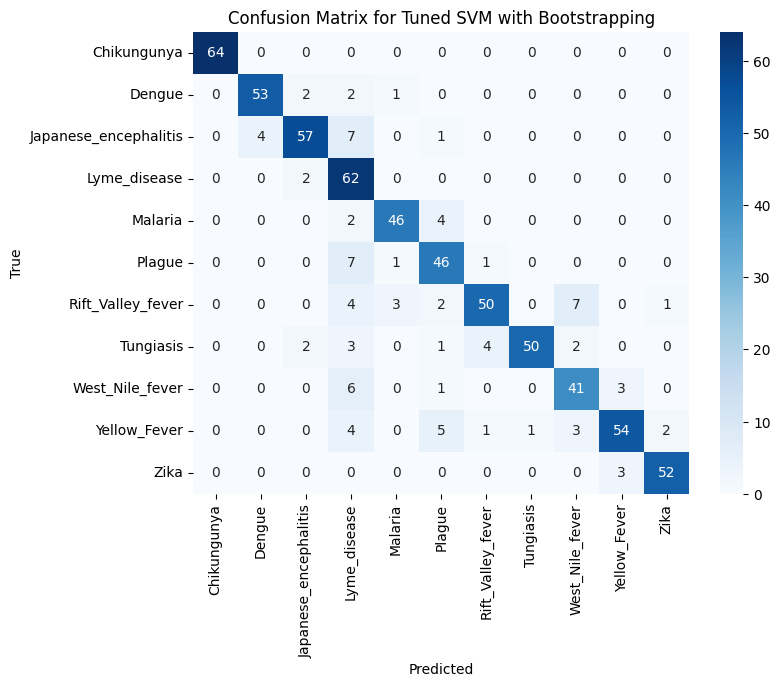

Tuned SVM ROC AUC (Bootstrapped): 0.9712


In [ ]:
# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, model_name):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Binarize the test labels for ROC AUC (multi-class support)
y_test_binarized = label_binarize(y_test, classes=np.arange(len(label_encoder.classes_)))
# Plot confusion matrix for the tuned SVM
plot_confusion_matrix(y_test_labels, y_pred_labels, "Tuned SVM with Bootstrapping")

# Predict probabilities using decision_function and calculate ROC AUC (ensure the model supports it)
if hasattr(svm_best, "decision_function"):
    y_pred_proba_svm = svm_best.decision_function(X_test)
    roc_auc_svm = roc_auc_score(y_test_binarized, y_pred_proba_svm, multi_class="ovr")
    print(f"Tuned SVM ROC AUC (Bootstrapped): {roc_auc_svm:.4f}")
else:
    print("ROC AUC calculation skipped as the model does not support `decision_function`.")

In [ ]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, accuracy_score

# Define the base MLP classifier
mlp = MLPClassifier(max_iter=300, random_state=42)

# Define the parameter grid
# param_grid = {
#     'hidden_layer_sizes': [(100,), (100, 50), (150, 75)],  # Various layer configurations
#     'activation': ['relu', 'tanh'],                       # Activation functions
#     'solver': ['adam', 'sgd'],                            # Solvers
#     'learning_rate': ['constant', 'adaptive'],            # Learning rate options
# }

param_grid = {
    'hidden_layer_sizes': [(150, 75)],  # Various layer configurations
    'activation': ['relu'],                       # Activation functions
    'solver': ['adam'],                            # Solvers
    'learning_rate': ['constant'],            # Learning rate options
}

# Perform grid search with 3-fold cross-validation
grid_search = GridSearchCV(mlp, param_grid, cv=3, scoring='accuracy', verbose=2)
grid_search.fit(X_train, y_train)

# Output best parameters
print("Best Parameters:", grid_search.best_params_)

# Evaluate the best model on the test set
best_mlp = grid_search.best_estimator_
y_pred_mlp = best_mlp.predict(X_test)

# Classification report and accuracy
print("\nMLP Classification Report:")
print(classification_report(y_test, y_pred_mlp, target_names=label_encoder.classes_, zero_division=0))
mlp_acc = accuracy_score(y_test, y_pred_mlp)
print(f"MLP Accuracy: {mlp_acc}")


Fitting 3 folds for each of 1 candidates, totalling 3 fits
[CV] END activation=relu, hidden_layer_sizes=(150, 75), learning_rate=constant, solver=adam; total time=   6.9s
[CV] END activation=relu, hidden_layer_sizes=(150, 75), learning_rate=constant, solver=adam; total time=  13.8s
[CV] END activation=relu, hidden_layer_sizes=(150, 75), learning_rate=constant, solver=adam; total time=  12.1s
Best Parameters: {'activation': 'relu', 'hidden_layer_sizes': (150, 75), 'learning_rate': 'constant', 'solver': 'adam'}

MLP Classification Report:
                       precision    recall  f1-score   support

          Chikungunya       1.00      0.98      0.99        64
               Dengue       0.93      0.97      0.95        58
Japanese_encephalitis       0.91      0.90      0.91        69
         Lyme_disease       0.92      0.92      0.92        64
              Malaria       0.98      0.94      0.96        52
               Plague       0.93      0.98      0.96        55
    Rift_Valley

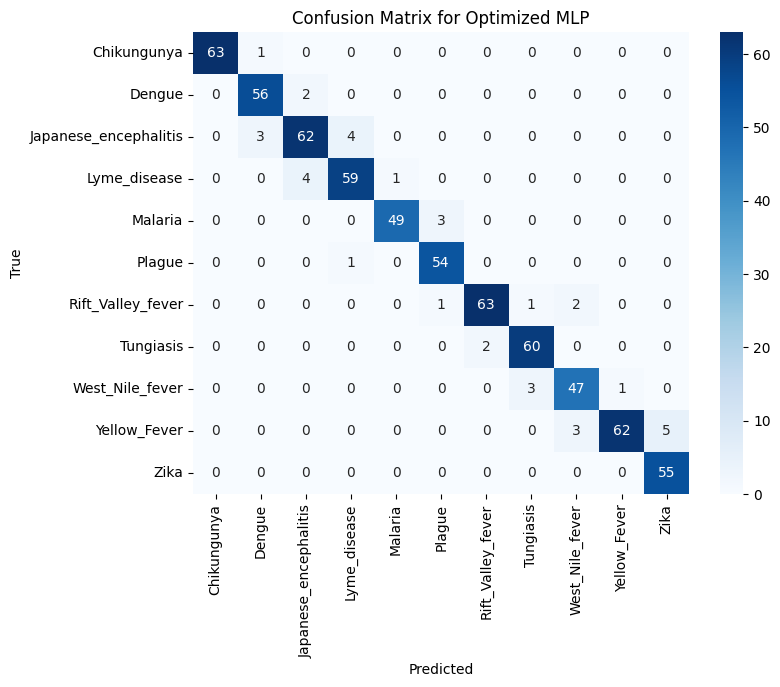


Optimized MLP ROC AUC: 0.9982


In [ ]:
y_pred_mlp_labels = label_encoder.inverse_transform(y_pred_mlp)
plot_confusion_matrix(y_test_labels, y_pred_mlp_labels, "Optimized MLP")

# Predict probabilities for ROC AUC calculation
y_pred_proba_mlp = best_mlp.predict_proba(X_test)
roc_auc_mlp = roc_auc_score(y_test_binarized, y_pred_proba_mlp, multi_class="ovr")

print(f"\nOptimized MLP ROC AUC: {roc_auc_mlp:.4f}")

In [ ]:
# Initialize models
nb = GaussianNB()
dt = DecisionTreeClassifier(random_state=42)
rf = RandomForestClassifier(random_state=42)

# Apply bootstrapping on Naive Bayes
y_pred_nb_bootstrap = bootstrap_model(nb, X_train, y_train, X_test)

# Apply bootstrapping on Decision Tree
y_pred_dt_bootstrap = bootstrap_model(dt, X_train, y_train, X_test)

# Apply bootstrapping on Random Forest (even though it already uses bootstrapping)
y_pred_rf_bootstrap = bootstrap_model(rf, X_train, y_train, X_test)

# Decode predictions to original prognosis names
y_test_labels = label_encoder.inverse_transform(y_test)
y_pred_nb_bootstrap_labels = label_encoder.inverse_transform(y_pred_nb_bootstrap)
y_pred_dt_bootstrap_labels = label_encoder.inverse_transform(y_pred_dt_bootstrap)
y_pred_rf_bootstrap_labels = label_encoder.inverse_transform(y_pred_rf_bootstrap)

# Evaluate the models

# Naive Bayes
print("\nNaive Bayes Classification Report:")
print(classification_report(y_test_labels, y_pred_nb_bootstrap_labels, target_names=label_encoder.classes_, zero_division=0))
nb_acc=accuracy_score(y_test_labels, y_pred_nb_bootstrap_labels)
print(f"Naive Bayes Accuracy: {nb_acc}")

# Decision Tree
print("\nDecision Tree Classification Report:")
print(classification_report(y_test_labels, y_pred_dt_bootstrap_labels, target_names=label_encoder.classes_, zero_division=0))
dt_acc=accuracy_score(y_test_labels, y_pred_dt_bootstrap_labels)
print(f"Decision Tree Accuracy: {dt_acc}")

# Random Forest
print("\nRandom Forest Classification Report:")
print(classification_report(y_test_labels, y_pred_rf_bootstrap_labels, target_names=label_encoder.classes_, zero_division=0))
rf_acc=accuracy_score(y_test_labels, y_pred_rf_bootstrap_labels)
print(f"Random Forest Accuracy: {rf_acc}")



Naive Bayes Classification Report:
                       precision    recall  f1-score   support

          Chikungunya       0.49      0.94      0.65        64
               Dengue       0.59      0.34      0.43        58
Japanese_encephalitis       0.81      0.43      0.57        69
         Lyme_disease       0.47      0.72      0.57        64
              Malaria       0.45      0.44      0.45        52
               Plague       0.41      0.29      0.34        55
    Rift_Valley_fever       0.60      0.31      0.41        67
            Tungiasis       0.64      0.77      0.70        62
      West_Nile_fever       0.30      0.20      0.24        51
         Yellow_Fever       0.40      0.57      0.47        70
                 Zika       0.44      0.36      0.40        55

             accuracy                           0.50       667
            macro avg       0.51      0.49      0.48       667
         weighted avg       0.52      0.50      0.48       667

Naive Bayes Accu

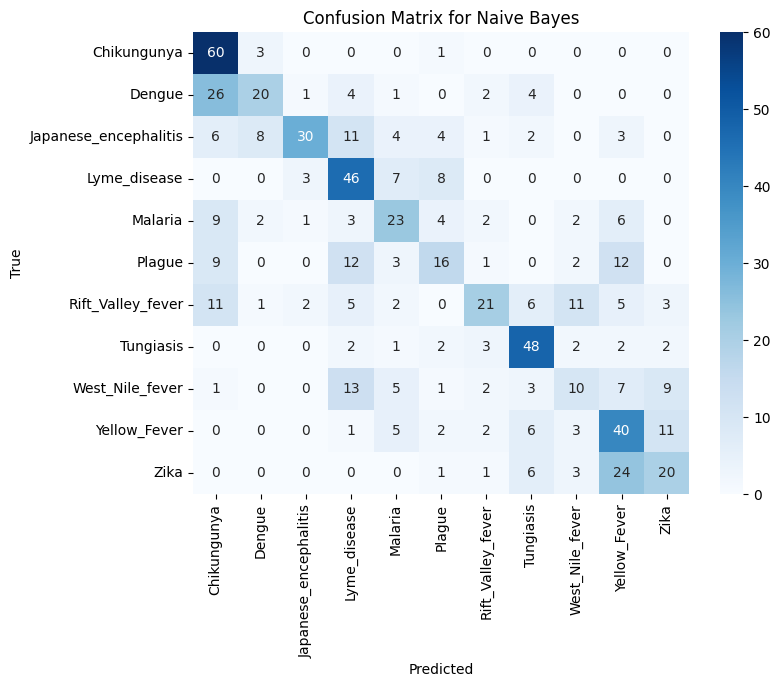

Naive Bayes ROC AUC: 0.8465


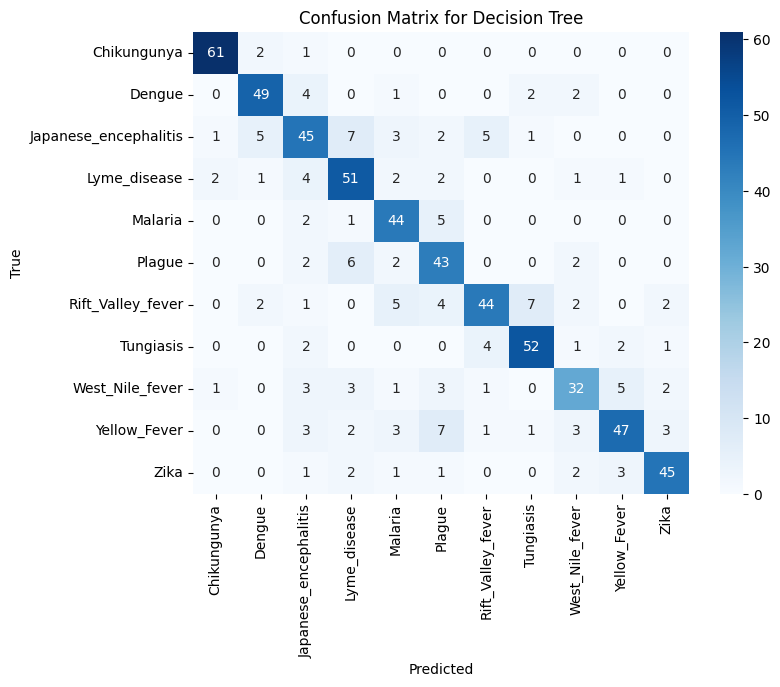

Decision Tree ROC AUC: 0.8361


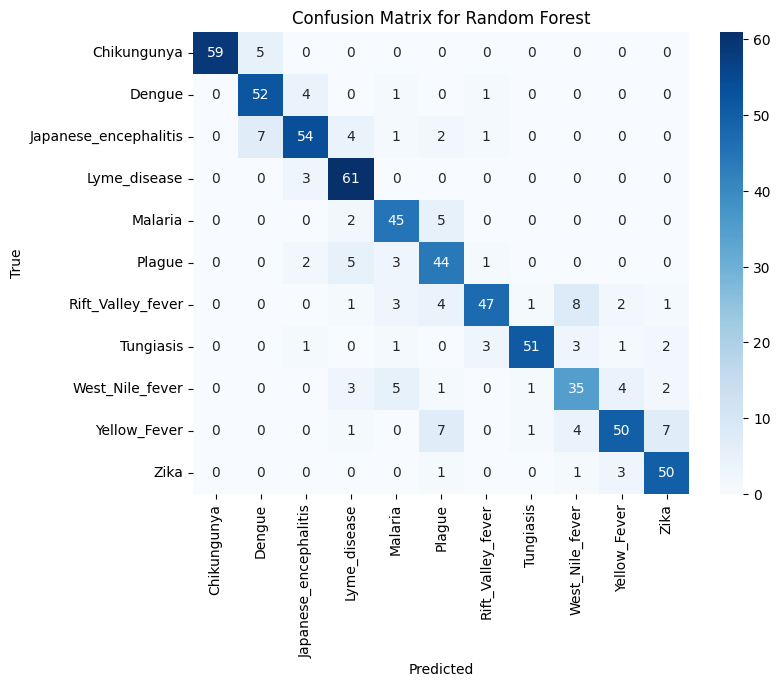

Random Forest ROC AUC: 0.9760


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, auc
from sklearn.preprocessing import label_binarize

plot_confusion_matrix(y_test_labels, y_pred_nb_bootstrap_labels, "Naive Bayes")
# ROC AUC
y_pred_nb_proba = nb.predict_proba(X_test)
roc_auc_nb = roc_auc_score(y_test_binarized, y_pred_nb_proba, multi_class="ovr")
print(f"Naive Bayes ROC AUC: {roc_auc_nb:.4f}")

plot_confusion_matrix(y_test_labels, y_pred_dt_bootstrap_labels, "Decision Tree")
# ROC AUC
y_pred_dt_proba = dt.predict_proba(X_test)
roc_auc_dt = roc_auc_score(y_test_binarized, y_pred_dt_proba, multi_class="ovr")
print(f"Decision Tree ROC AUC: {roc_auc_dt:.4f}")

plot_confusion_matrix(y_test_labels, y_pred_rf_bootstrap_labels, "Random Forest")
# ROC AUC
y_pred_rf_proba = rf.predict_proba(X_test)
roc_auc_rf = roc_auc_score(y_test_binarized, y_pred_rf_proba, multi_class="ovr")
print(f"Random Forest ROC AUC: {roc_auc_rf:.4f}")

In [ ]:
from sklearn.linear_model import LogisticRegression  # Import Logistic Regression

lr = LogisticRegression(random_state=42, max_iter=1000)  # Initialize Logistic Regression

# Logistic Regression
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

y_pred_lr_labels = label_encoder.inverse_transform(y_pred_lr)

# Logistic Regression with L1 Regularization (Lasso)
lr_l1 = LogisticRegression(random_state=42, max_iter=1000, penalty='l1', solver='liblinear', C=1)

# Apply bootstrapping on Logistic Regression with L1 Regularization
y_pred_lr_l1_bootstrap = bootstrap_model(lr_l1, X_train, y_train, X_test)

# Decode predictions to original prognosis names
y_pred_lr_l1_bootstrap_labels = label_encoder.inverse_transform(y_pred_lr_l1_bootstrap)

# Logistic Regression with L2 Regularization (Ridge)
lr_l2 = LogisticRegression(random_state=42, max_iter=1000, penalty='l2', solver='lbfgs', C=1)

# Apply bootstrapping on Logistic Regression with L2 Regularization
y_pred_lr_l2_bootstrap = bootstrap_model(lr_l2, X_train, y_train, X_test)

# Decode predictions to original prognosis names
y_pred_lr_l2_bootstrap_labels = label_encoder.inverse_transform(y_pred_lr_l2_bootstrap)


# Logistic Regression
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test_labels, y_pred_lr_labels, target_names=label_encoder.classes_, zero_division=0))
lr_acc = accuracy_score(y_test_labels, y_pred_lr_labels)
print(f"Logistic Regression Accuracy: {lr_acc}")


# Evaluate Logistic Regression with L1 Regularization
print("\nLogistic Regression with L1 Regularization Classification Report:")
print(classification_report(y_test_labels, y_pred_lr_l1_bootstrap_labels, target_names=label_encoder.classes_, zero_division=0))
lr_l1_acc = accuracy_score(y_test_labels, y_pred_lr_l1_bootstrap_labels)
print(f"Logistic Regression with L1 Regularization Accuracy: {lr_l1_acc}")


# Evaluate Logistic Regression with L2 Regularization
print("\nLogistic Regression with L2 Regularization Classification Report:")
print(classification_report(y_test_labels, y_pred_lr_l2_bootstrap_labels, target_names=label_encoder.classes_, zero_division=0))
lr_l2_acc = accuracy_score(y_test_labels, y_pred_lr_l2_bootstrap_labels)
print(f"Logistic Regression with L2 Regularization Accuracy: {lr_l2_acc}")
lr_acc_new=max(lr_acc, lr_l1_acc, lr_l2_acc)


Logistic Regression Classification Report:
                       precision    recall  f1-score   support

          Chikungunya       0.97      0.95      0.96        64
               Dengue       0.74      0.93      0.82        58
Japanese_encephalitis       0.88      0.65      0.75        69
         Lyme_disease       0.81      0.81      0.81        64
              Malaria       0.69      0.85      0.76        52
               Plague       0.72      0.65      0.69        55
    Rift_Valley_fever       0.82      0.70      0.76        67
            Tungiasis       0.84      0.92      0.88        62
      West_Nile_fever       0.79      0.88      0.83        51
         Yellow_Fever       0.91      0.76      0.83        70
                 Zika       0.89      1.00      0.94        55

             accuracy                           0.82       667
            macro avg       0.82      0.83      0.82       667
         weighted avg       0.83      0.82      0.82       667

Logistic

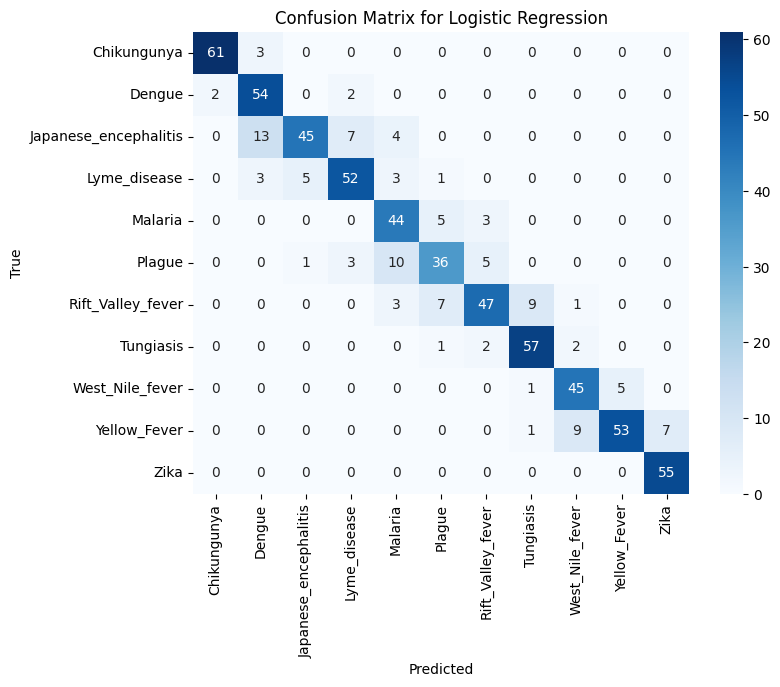

Logistic Regression ROC AUC: 0.9847


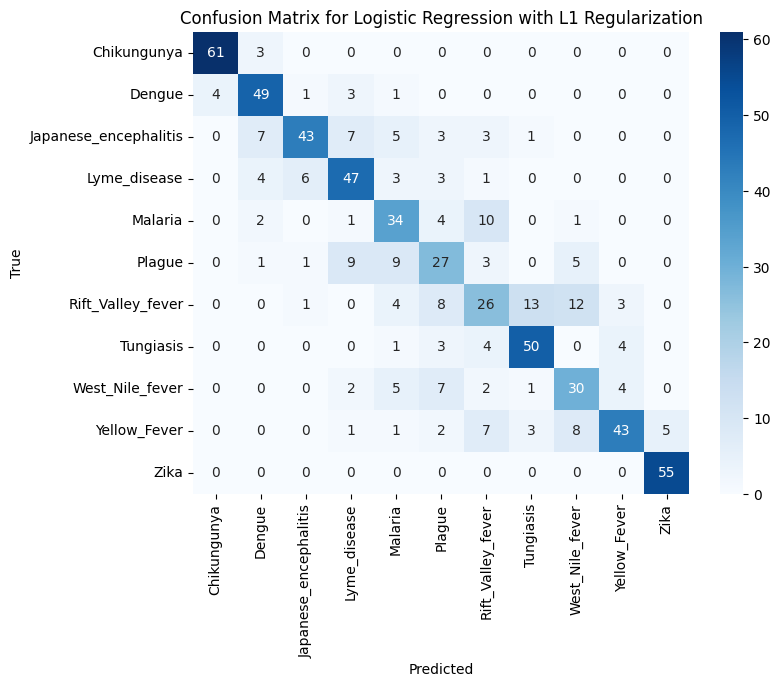

Logistic Regression with L1 Regularization ROC AUC: 0.9350


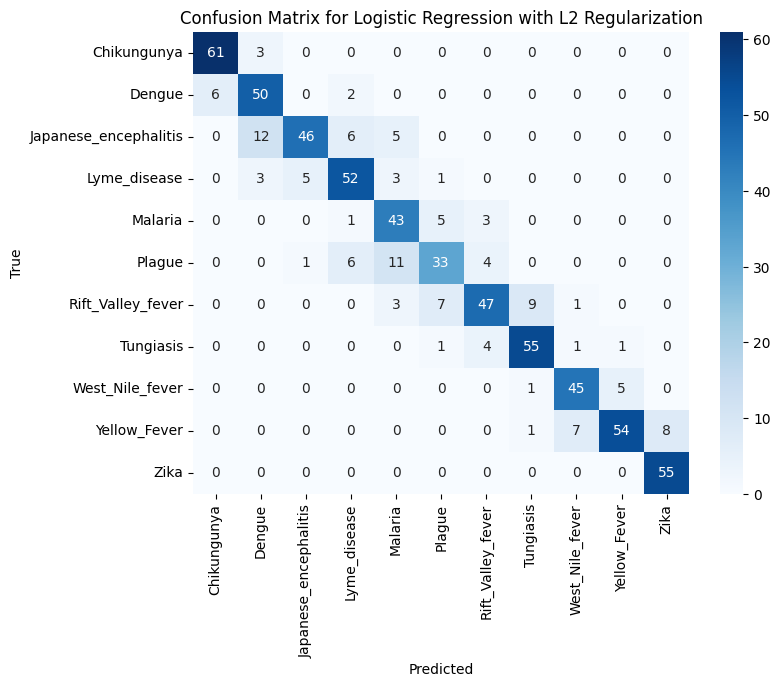

Logistic Regression with L2 Regularization ROC AUC: 0.9806


In [ ]:
plot_confusion_matrix(y_test_labels, y_pred_lr_labels, "Logistic Regression")
# ROC AUC
y_pred_lr_proba = lr.predict_proba(X_test)
roc_auc_lr = roc_auc_score(y_test_binarized, y_pred_lr_proba, multi_class="ovr")
print(f"Logistic Regression ROC AUC: {roc_auc_lr:.4f}")

plot_confusion_matrix(y_test_labels, y_pred_lr_l1_bootstrap_labels, "Logistic Regression with L1 Regularization")
# ROC AUC
y_pred_lr_l1_proba = lr_l1.predict_proba(X_test)
roc_auc_lr_l1 = roc_auc_score(y_test_binarized, y_pred_lr_l1_proba, multi_class="ovr")
print(f"Logistic Regression with L1 Regularization ROC AUC: {roc_auc_lr_l1:.4f}")

plot_confusion_matrix(y_test_labels, y_pred_lr_l2_bootstrap_labels, "Logistic Regression with L2 Regularization")
# ROC AUC
y_pred_lr_l2_proba = lr_l2.predict_proba(X_test)
roc_auc_lr_l2 = roc_auc_score(y_test_binarized, y_pred_lr_l2_proba, multi_class="ovr")
print(f"Logistic Regression with L2 Regularization ROC AUC: {roc_auc_lr_l2:.4f}")

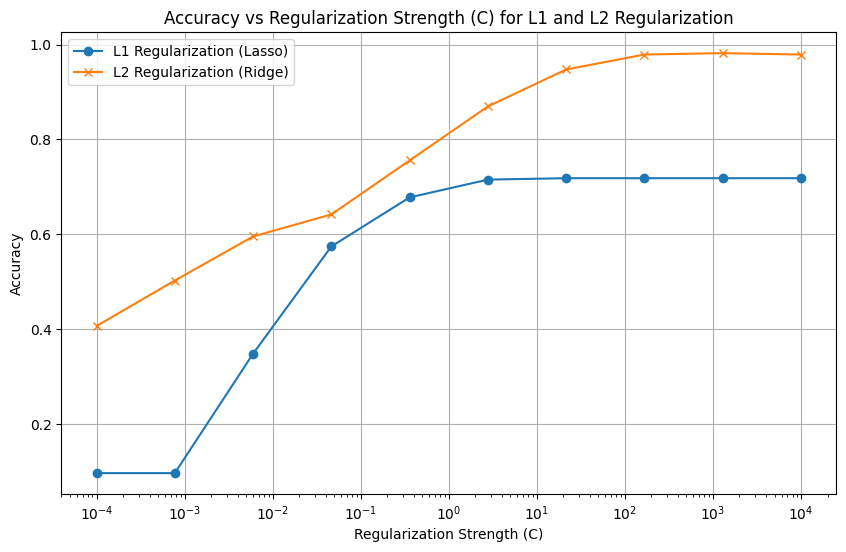

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# Range of regularization strengths (C values) to test
C_values = np.logspace(-4, 4, 10)  # 10 values from 1e-4 to 1e4

# Lists to store accuracies for L1 and L2 regularization
l1_accuracies = []
l2_accuracies = []

# Evaluate model for each value of C
for C in C_values:
    # L1 Regularization
    lr_l1 = LogisticRegression(random_state=42, max_iter=1000, penalty='l1', solver='liblinear', C=C)
    lr_l1.fit(X_train, y_train)
    y_pred_l1 = lr_l1.predict(X_test)
    lr_l1_acc = accuracy_score(y_test_labels, label_encoder.inverse_transform(y_pred_l1))
    l1_accuracies.append(lr_l1_acc)

    # L2 Regularization
    lr_l2 = LogisticRegression(random_state=42, max_iter=1000, penalty='l2', solver='lbfgs', C=C)
    lr_l2.fit(X_train, y_train)
    y_pred_l2 = lr_l2.predict(X_test)
    lr_l2_acc = accuracy_score(y_test_labels, label_encoder.inverse_transform(y_pred_l2))
    l2_accuracies.append(lr_l2_acc)

# Plotting the results
plt.figure(figsize=(10, 6))
plt.plot(C_values, l1_accuracies, label="L1 Regularization (Lasso)", marker='o')
plt.plot(C_values, l2_accuracies, label="L2 Regularization (Ridge)", marker='x')

# Log scale for the x-axis (C values)
plt.xscale('log')

# Adding labels and title
plt.xlabel("Regularization Strength (C)")
plt.ylabel("Accuracy")
plt.title("Accuracy vs Regularization Strength (C) for L1 and L2 Regularization")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, log_loss, classification_report

# Initialize XGBoost classifier without bootstrapping (use all data and features)
xgb_model = xgb.XGBClassifier(
    n_estimators=100,       # Number of trees
    max_depth=5,            # Max depth of trees
    subsample=1.0,          # Use 100% of training data for each tree (no bootstrapping)
    colsample_bytree=1.0,   # Use 100% of features for each tree
    random_state=42
)

# Train the XGBoost model on the full training data
xgb_model.fit(X_train, y_train)

# Make predictions on the test set
y_pred_xgb = xgb_model.predict(X_test)

# Get predicted probabilities for the test set (for log loss calculation)
y_pred_proba_xgb = xgb_model.predict_proba(X_test)

# Decode predictions to original prognosis names
y_test_labels = label_encoder.inverse_transform(y_test)
y_pred_xgb_labels = label_encoder.inverse_transform(y_pred_xgb)

# Calculate test accuracy
test_accuracy_xgb = accuracy_score(y_test_labels, y_pred_xgb_labels)

# Encode the target variable for the test set
y_test_encoded = label_encoder.transform(y_test_labels)

# Calculate test loss using the predicted probabilities
test_loss_xgb = log_loss(y_test_encoded, y_pred_proba_xgb)

# Print classification report
print("\nXGBoost Classification Report:")
print(classification_report(y_test_labels, y_pred_xgb_labels, target_names=label_encoder.classes_, zero_division=0))
print(f"XGBoost Accuracy: {test_accuracy_xgb}")


XGBoost Classification Report:
                       precision    recall  f1-score   support

          Chikungunya       1.00      0.95      0.98        64
               Dengue       0.82      0.91      0.86        58
Japanese_encephalitis       0.84      0.75      0.79        69
         Lyme_disease       0.87      0.94      0.90        64
              Malaria       0.82      0.87      0.84        52
               Plague       0.78      0.91      0.84        55
    Rift_Valley_fever       0.83      0.73      0.78        67
            Tungiasis       0.91      0.85      0.88        62
      West_Nile_fever       0.70      0.78      0.74        51
         Yellow_Fever       0.89      0.71      0.79        70
                 Zika       0.82      0.91      0.86        55

             accuracy                           0.84       667
            macro avg       0.84      0.85      0.84       667
         weighted avg       0.85      0.84      0.84       667

XGBoost Accuracy: 0.

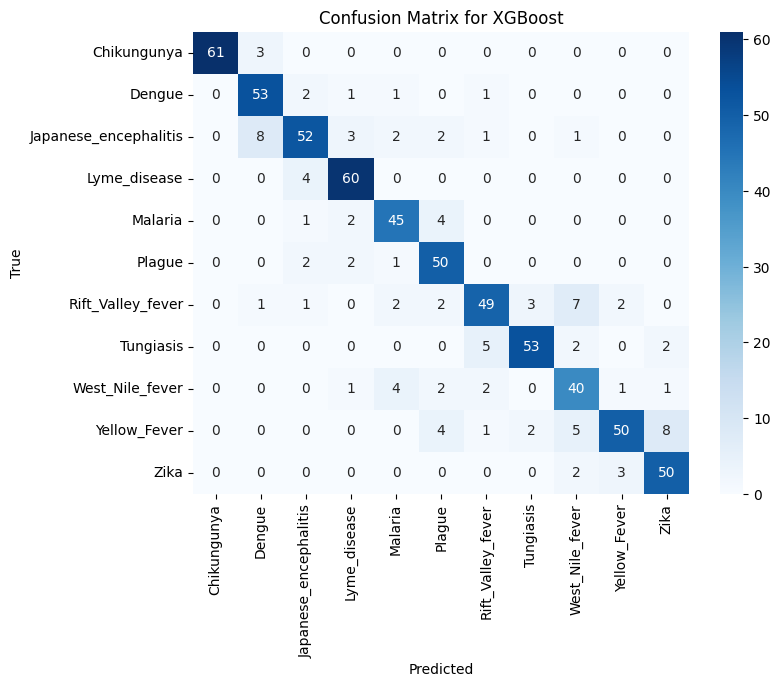

XGBoost ROC AUC: 0.9854


In [ ]:
plot_confusion_matrix(y_test_labels, y_pred_xgb_labels, "XGBoost")

# ROC AUC Calculation
roc_auc_xgb = roc_auc_score(y_test_binarized, y_pred_proba_xgb, multi_class="ovr")
print(f"XGBoost ROC AUC: {roc_auc_xgb:.4f}")

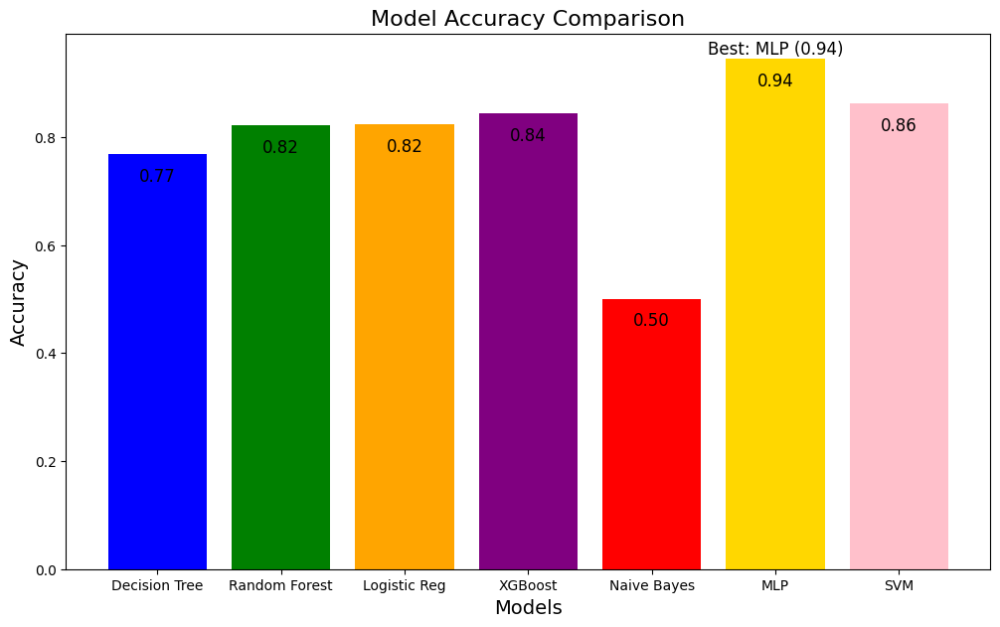

The model with the highest accuracy is MLP with an accuracy of 0.94


In [ ]:
import matplotlib.pyplot as plt

# Create a dictionary of model names and their respective accuracies
model_accuracies = {
    'Decision Tree': dt_acc,
    'Random Forest': rf_acc,
    'Logistic Reg': lr_acc,
    'XGBoost': test_accuracy_xgb,
    'Naive Bayes': nb_acc,
    'MLP': mlp_acc,
    'SVM': svm_acc
}

# Find the model with the highest accuracy
best_model = max(model_accuracies, key=model_accuracies.get)
best_accuracy = model_accuracies[best_model]

# Plotting the accuracies
models = list(model_accuracies.keys())
accuracies = list(model_accuracies.values())

plt.figure(figsize=(12, 7))
bars = plt.bar(models, accuracies, color=['blue', 'green', 'orange', 'purple', 'red', 'cyan', 'pink'])

# Highlight the model with the highest accuracy
plt.bar(best_model, best_accuracy, color='gold')

# Add labels and title
plt.xlabel('Models', fontsize=14)
plt.ylabel('Accuracy', fontsize=14)
plt.title('Model Accuracy Comparison', fontsize=16)

# Annotate each bar with its respective accuracy
for bar, accuracy in zip(bars, accuracies):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() - 0.05, f"{accuracy:.2f}", ha='center', color='black', fontsize=12)

# Highlight the best model
plt.text(models.index(best_model), best_accuracy + 0.01, f"Best: {best_model} ({best_accuracy:.2f})", ha='center', fontsize=12, color='black')

# Show the plot
plt.show()

# Print the model with the highest accuracy
print(f"The model with the highest accuracy is {best_model} with an accuracy of {best_accuracy:.2f}")
